<a href="https://colab.research.google.com/github/AnhVietPham/Deep-Learning/blob/main/kaggle/Plant_Pathology_A_Team_KHTN.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
import time, os
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from matplotlib.image import imread
from torch.utils.data import random_split
from PIL import Image
from torch.utils.tensorboard import SummaryWriter
from torch.optim import lr_scheduler
import torchvision.models as models
import cv2
import torchvision
from skimage import io
import torch
from tqdm import tqdm
import copy
import json
import torch.nn as nn
import torch.optim as optim
import torch.nn.functional as F
from torchvision import datasets, transforms
from IPython.display import clear_output

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
!unzip '/content/drive/MyDrive/Data-Kaggle/Plant Pathology 2020 - FGVC7/plant-pathology-2020-fgvc7.zip' -d '/content/plantpathology-A-Team'

Archive:  /content/drive/MyDrive/Data-Kaggle/Plant Pathology 2020 - FGVC7/plant-pathology-2020-fgvc7.zip
  inflating: /content/plantpathology-A-Team/images/Test_0.jpg  
  inflating: /content/plantpathology-A-Team/images/Test_1.jpg  
  inflating: /content/plantpathology-A-Team/images/Test_10.jpg  
  inflating: /content/plantpathology-A-Team/images/Test_100.jpg  
  inflating: /content/plantpathology-A-Team/images/Test_1000.jpg  
  inflating: /content/plantpathology-A-Team/images/Test_1001.jpg  
  inflating: /content/plantpathology-A-Team/images/Test_1002.jpg  
  inflating: /content/plantpathology-A-Team/images/Test_1003.jpg  
  inflating: /content/plantpathology-A-Team/images/Test_1004.jpg  
  inflating: /content/plantpathology-A-Team/images/Test_1005.jpg  
  inflating: /content/plantpathology-A-Team/images/Test_1006.jpg  
  inflating: /content/plantpathology-A-Team/images/Test_1007.jpg  
  inflating: /content/plantpathology-A-Team/images/Test_1008.jpg  
  inflating: /content/plantpathol

In [ ]:
def get_num_files(path):
    '''
    Counts the number of files in a folder.
    '''
    if not os.path.exists(path):
        return 0
    return sum([len(files) for r, d, files in os.walk(path)])

In [ ]:
dataset_dir = '/content/plantpathology-A-Team/images'
dataset_size = get_num_files(dataset_dir)
print('Data samples size: ', dataset_size)

Data samples size:  3642


In [ ]:
root = '/content/plantpathology-A-Team/'
train = pd.read_csv(os.path.join(root,'train.csv'))
test = pd.read_csv(os.path.join(root,'test.csv'))
submission = pd.read_csv(os.path.join(root,'sample_submission.csv'))
images = os.path.join(root,'images')

In [ ]:
from google.colab import data_table
data_table.DataTable(train, include_index=True, num_rows_per_page=10)

,image_id,healthy,multiple_diseases,rust,scab
0,Train_0,0,0,0,1
1,Train_1,0,1,0,0
2,Train_2,1,0,0,0
3,Train_3,0,0,1,0
4,Train_4,1,0,0,0
...,...,...,...,...,...
1816,Train_1816,0,0,0,1
1817,Train_1817,1,0,0,0
1818,Train_1818,1,0,0,0
1819,Train_1819,0,0,1,0


In [ ]:
data_table.DataTable(submission, include_index=True, num_rows_per_page=10)

,image_id,healthy,multiple_diseases,rust,scab
0,Test_0,0.25,0.25,0.25,0.25
1,Test_1,0.25,0.25,0.25,0.25
2,Test_2,0.25,0.25,0.25,0.25
3,Test_3,0.25,0.25,0.25,0.25
4,Test_4,0.25,0.25,0.25,0.25
...,...,...,...,...,...
1816,Test_1816,0.25,0.25,0.25,0.25
1817,Test_1817,0.25,0.25,0.25,0.25
1818,Test_1818,0.25,0.25,0.25,0.25
1819,Test_1819,0.25,0.25,0.25,0.25


In [ ]:
data_table.DataTable(test, include_index=True, num_rows_per_page=10)

,image_id
0,Test_0
1,Test_1
2,Test_2
3,Test_3
4,Test_4
...,...
1816,Test_1816
1817,Test_1817
1818,Test_1818
1819,Test_1819


In [ ]:
print(train[train['healthy'].apply(lambda x: x == 1)]['image_id'].sample(4).values + '.jpg')

['Train_320.jpg' 'Train_421.jpg' 'Train_885.jpg' 'Train_897.jpg']


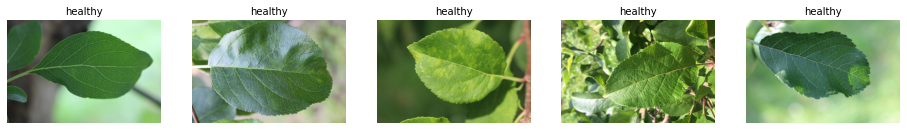

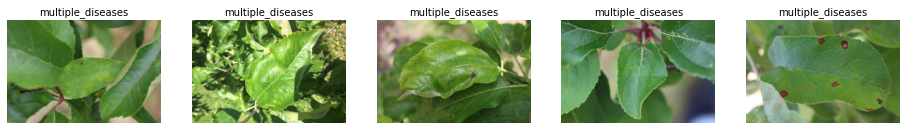

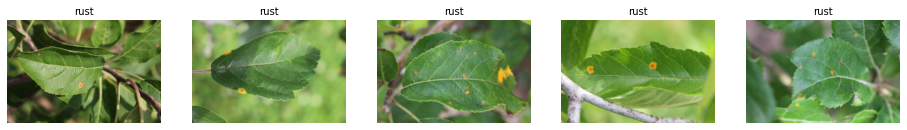

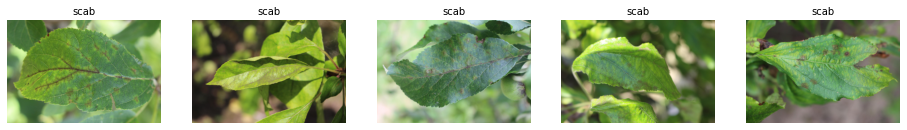

In [ ]:
def show_images(images, type):
  fig = plt.figure(figsize=(16,4))
  num = len(images)
  for i in range(num):
    a = fig.add_subplot(1, num, i + 1)
    a.set_title(type, fontsize = 10)
    image = imread(os.path.join(root,'images', images[i]))
    plt.imshow(image)
    plt.axis('off')

col = ['healthy', 'multiple_diseases','rust','scab']

for column in col:
    images = (train[train[column].apply(lambda x: x==1)]['image_id'].sample(5).values)+'.jpg'
    show_images(images,column)

In [ ]:
def get_path(image):
  return os.path.join(root,'images', str(image) + '.jpg')

train_data = train.copy()
data_table.DataTable(train_data, include_index=True, num_rows_per_page=10)

,image_id,healthy,multiple_diseases,rust,scab
0,Train_0,0,0,0,1
1,Train_1,0,1,0,0
2,Train_2,1,0,0,0
3,Train_3,0,0,1,0
4,Train_4,1,0,0,0
...,...,...,...,...,...
1816,Train_1816,0,0,0,1
1817,Train_1817,1,0,0,0
1818,Train_1818,1,0,0,0
1819,Train_1819,0,0,1,0


In [ ]:
train_data['image_path'] = train_data['image_id'].apply(get_path)
data_table.DataTable(train_data, include_index=True, num_rows_per_page=10)

,image_id,healthy,multiple_diseases,rust,scab,image_path
0,Train_0,0,0,0,1,/content/plantpathology-A-Team/images/Train_0.jpg
1,Train_1,0,1,0,0,/content/plantpathology-A-Team/images/Train_1.jpg
2,Train_2,1,0,0,0,/content/plantpathology-A-Team/images/Train_2.jpg
3,Train_3,0,0,1,0,/content/plantpathology-A-Team/images/Train_3.jpg
4,Train_4,1,0,0,0,/content/plantpathology-A-Team/images/Train_4.jpg
...,...,...,...,...,...,...
1816,Train_1816,0,0,0,1,/content/plantpathology-A-Team/images/Train_18...
1817,Train_1817,1,0,0,0,/content/plantpathology-A-Team/images/Train_18...
1818,Train_1818,1,0,0,0,/content/plantpathology-A-Team/images/Train_18...
1819,Train_1819,0,0,1,0,/content/plantpathology-A-Team/images/Train_18...


In [ ]:
train_labels = train.loc[:,'healthy':'scab']
data_table.DataTable(train_labels, include_index=True, num_rows_per_page=10)

,healthy,multiple_diseases,rust,scab
0,0,0,0,1
1,0,1,0,0
2,1,0,0,0
3,0,0,1,0
4,1,0,0,0
...,...,...,...,...
1816,0,0,0,1
1817,1,0,0,0
1818,1,0,0,0
1819,0,0,1,0


In [ ]:
test_data = test.copy()
data_table.DataTable(test, include_index=True, num_rows_per_page=10)

,image_id
0,Test_0
1,Test_1
2,Test_2
3,Test_3
4,Test_4
...,...
1816,Test_1816
1817,Test_1817
1818,Test_1818
1819,Test_1819


In [ ]:
test_data['image_path'] = test_data['image_id'].apply(get_path)
data_table.DataTable(test_data, include_index=True, num_rows_per_page=10)

,image_id,image_path
0,Test_0,/content/plantpathology-A-Team/images/Test_0.jpg
1,Test_1,/content/plantpathology-A-Team/images/Test_1.jpg
2,Test_2,/content/plantpathology-A-Team/images/Test_2.jpg
3,Test_3,/content/plantpathology-A-Team/images/Test_3.jpg
4,Test_4,/content/plantpathology-A-Team/images/Test_4.jpg
...,...,...
1816,Test_1816,/content/plantpathology-A-Team/images/Test_181...
1817,Test_1817,/content/plantpathology-A-Team/images/Test_181...
1818,Test_1818,/content/plantpathology-A-Team/images/Test_181...
1819,Test_1819,/content/plantpathology-A-Team/images/Test_181...


In [ ]:
test_paths = test_data['image_path']

In [ ]:
# import modules to build RunBuilder and RunManager helper classes
from collections  import OrderedDict
from collections import namedtuple
from itertools import product

class RunBuilder():
    @staticmethod
    def get_runs(params):

        Run = namedtuple('Run', params.keys())

        runs = []
        for v in product(*params.values()):
            runs.append(Run(*v))

        return runs


In [ ]:
class RunManager():
    def __init__(self):
        
        self.epoch_count = 0
        self.epoch_start_time = None

        self.epoch_train_loss = 0
        self.epoch_train_num_correct = 0

        self.epoch_valid_loss = 0
        self.epoch_valid_num_correct = 0
        
        self.run_params = None
        self.run_count = 0
        self.run_data = []
        self.run_start_time = None
        
        self.network = None
        self.train_loader = None
        self.valid_loader = None
        self.tb = None
        
    def begin_run(self, run, network, train_loader, valid_loader):
        
        self.run_start_time = time.time()

        self.run_params = run
        self.run_count += 1
        
        self.network = network
        self.train_loader = train_loader
        self.valid_loader = valid_loader
        self.tb = SummaryWriter(comment=f'-{run}')
        
    def end_run(self):
        self.tb.close()
        self.epoch_count = 0   

    def begin_train_epoch(self):
        self.epoch_start_time = time.time()
        
        self.epoch_count += 1
        self.epoch_train_loss = 0
        self.epoch_train_num_correct = 0

    def begin_valid_epoch(self):        
        self.epoch_valid_loss = 0
        self.epoch_valid_num_correct = 0

    def end_epoch(self):
        
        epoch_duration = time.time() - self.epoch_start_time
        run_duration = time.time() - self.run_start_time
        
        train_loss = self.epoch_train_loss / len(self.train_loader.dataset)
        train_accuracy = self.epoch_train_num_correct / len(self.train_loader.dataset)

        valid_loss = self.epoch_valid_loss / len(self.valid_loader.dataset)
        valid_accuracy = self.epoch_valid_num_correct / len(self.valid_loader.dataset)
        
        results = OrderedDict()
        results["run"] = self.run_count
        results["epoch"] = self.epoch_count
        results['train_loss'] = train_loss
        results["train_accuracy"] = train_accuracy
        results['valid_loss'] = valid_loss
        results["valid_accuracy"] = valid_accuracy
        results['epoch duration'] = epoch_duration
        results['run duration'] = run_duration
        for k,v in self.run_params._asdict().items(): results[k] = v
        self.run_data.append(results)
        
        df = pd.DataFrame.from_dict(self.run_data, orient='columns')
        
        clear_output(wait=True)
        display(df)
        return valid_accuracy
        
    def track_train_loss(self, loss, batch):
        self.epoch_train_loss += loss.item() * batch[0].shape[0]
        
    def track_train_num_correct(self, preds, labels):
        self.epoch_train_num_correct += self._get_num_correct(preds, labels)

    def track_valid_loss(self, loss, batch):
        self.epoch_valid_loss += loss.item() * batch[0].shape[0]
        
    def track_valid_num_correct(self, preds, labels):
        self.epoch_valid_num_correct += self._get_num_correct(preds, labels)
    
    def _get_num_correct(self, preds, labels):
        return preds.argmax(dim=1).eq(labels).sum().item()

    def save(self, fileName):
        
        pd.DataFrame.from_dict(
            self.run_data
            ,orient='columns'
        ).to_csv(f'/content/drive/MyDrive/Data-Kaggle/Plant Pathology 2020 - FGVC7/{fileName}.csv')
        
        with open(f'/content/drive/MyDrive/Data-Kaggle/Plant Pathology 2020 - FGVC7/{fileName}.json', 'w', encoding='utf-8') as f:
            json.dump(self.run_data, f, ensure_ascii=False, indent=4)

In [ ]:
class PlantPathologyDataset(torch.utils.data.Dataset):
    def __init__(self, df,  labels = None, test = False, transforms=None):
        self.df = df
        self.test = test
        if test == False:
          self.labels = labels
        self.transforms=transforms
        
    def __getitem__(self,idx):
        img_path = self.df.loc[idx, 'image_path']
        image = Image.open(img_path)

        if self.test == False:
          labels = torch.tensor(np.argmax(self.labels.iloc[idx, :]))
        
        if self.transforms:
            transformed = self.transforms(image)

        if self.test == False:
          return transformed, labels
        return transformed

    def __len__(self):
        return self.df.shape[0]

In [ ]:
normalize_imagenet = transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])

In [ ]:
plant_pathology_dataset_normalization = PlantPathologyDataset(
        df=train_data,
        labels = train_labels,
        transforms=transforms.Compose([
        transforms.Resize((256,256)),
        transforms.CenterCrop((224,224)),
        transforms.ToTensor(),
        normalize_imagenet
        ]))
val_size_normalization = int(np.floor(0.2 * len(plant_pathology_dataset_normalization)))
train_size_normalization = len(plant_pathology_dataset_normalization) - val_size_normalization
train_dataset_normalization, val_dataset_normalization = random_split(plant_pathology_dataset_normalization, [train_size_normalization, val_size_normalization])
train_loader_normalization = torch.utils.data.DataLoader(train_dataset_normalization,shuffle=True, batch_size= 30)
valid_loader_normalization = torch.utils.data.DataLoader(val_dataset_normalization, shuffle=False, batch_size= 30)

# **Resnet18 Pretrained Model**

In [ ]:
model_conv = models.resnet18(pretrained=True)
num_ftrs = model_conv.fc.in_features
model_conv.fc = nn.Sequential(
        nn.Linear(num_ftrs, 4),
        nn.Softmax(dim=1)
    )

In [ ]:
train_dataloaders = {
    'normalization': train_loader_normalization
}
valid_dataloaders = {
    'normalization': valid_loader_normalization
}
networks = {
    'no_dropout': model_conv
}

In [ ]:
device = torch.device("cuda" if torch.cuda.is_available() else 'cpu')

In [ ]:
params = OrderedDict(
    lr = [.001],
    momentum = [0.9],
    batch_size = [30],
    num_workers = [1],
    device = ['cuda'],
    dataloaders = ['normalization'],
    network = list(networks.keys())
)

In [ ]:
m = RunManager()
best_acc = 0.0
for run in RunBuilder.get_runs(params):
  device = torch.device(run.device) 
  network = networks[run.network].to(device)

  train_loader = train_dataloaders[run.dataloaders]
  valid_loader = valid_dataloaders[run.dataloaders]
  
  best_model_wts = copy.deepcopy(network.state_dict())

  optimizer = optim.SGD(network.parameters(), lr= run.lr, momentum= run.momentum)

  m.begin_run(run, network, train_loader, valid_loader)
  for epoch in range(50):
    m.begin_train_epoch()
    network.train()
    for batch in train_loader:
      images = batch[0].to(device)
      labels = batch[1].to(device)
      preds = network(images)
      loss = F.cross_entropy(preds, labels)
      optimizer.zero_grad()
      loss.backward()
      optimizer.step()
      m.track_train_loss(loss, batch)
      m.track_train_num_correct(preds, labels)
    m.begin_valid_epoch()
    network.eval()
    for batch in valid_loader:
      images = batch[0].to(device)
      labels = batch[1].to(device)
      preds = network(images)
      loss = F.cross_entropy(preds, labels)
      m.track_valid_loss(loss, batch)
      m.track_valid_num_correct(preds, labels)
    epoch_acc = m.end_epoch()
    if epoch_acc > best_acc:
      best_acc = epoch_acc
      best_model_wts = copy.deepcopy(network.state_dict())
      torch.save({
            'network': run.network,
            'epoch': epoch,
            'model_state_dict': best_model_wts,
            'optimizer_state_dict': optimizer.state_dict(),
            'best_acc': best_acc}, f'/content/drive/MyDrive/Data-Kaggle/Plant Pathology 2020 - FGVC7/best_model_wts.pth')

  m.end_run()
m.save('results')

,run,epoch,train_loss,train_accuracy,valid_loss,valid_accuracy,epoch duration,run duration,lr,momentum,batch_size,num_workers,device,dataloaders,network
0,1,1,1.375736,0.293068,1.322994,0.434066,77.784524,77.786285,0.001,0.9,30,1,cuda,normalization,no_dropout
1,1,2,1.292251,0.470830,1.247878,0.579670,80.198533,159.517404,0.001,0.9,30,1,cuda,normalization,no_dropout
2,1,3,1.214042,0.648593,1.168943,0.695055,80.167579,239.985635,0.001,0.9,30,1,cuda,normalization,no_dropout
3,1,4,1.133419,0.758408,1.091801,0.802198,79.182126,319.469696,0.001,0.9,30,1,cuda,normalization,no_dropout
4,1,5,1.059628,0.833219,1.022546,0.829670,79.239617,399.021014,0.001,0.9,30,1,cuda,normalization,no_dropout
5,1,6,0.999044,0.862045,0.976865,0.854396,78.950281,478.269436,0.001,0.9,30,1,cuda,normalization,no_dropout
6,1,7,0.952588,0.890185,0.944107,0.865385,80.133487,558.732342,0.001,0.9,30,1,cuda,normalization,no_dropout
7,1,8,0.921126,0.899108,0.922480,0.879121,80.020956,639.053309,0.001,0.9,30,1,cuda,normalization,no_dropout
8,1,9,0.897694,0.907344,0.909749,0.876374,80.610429,719.976813,0.001,0.9,30,1,cuda,normalization,no_dropout
9,1,10,0.880978,0.910089,0.898917,0.881868,79.721088,799.725018,0.001,0.9,30,1,cuda,normalization,no_dropout


In [ ]:
def test_function(model, loader):
    preds_for_output = np.zeros((1,4))
    progress = tqdm(loader, desc="Testing")
    with torch.no_grad():
        for _, images in enumerate(progress):
            images = images.to(device)
            model.eval()
            predictions = model(images)
            preds_for_output = np.append(preds_for_output, predictions.cpu().detach().numpy(), axis= 0)
        preds_for_output = np.delete(preds_for_output, 0, 0)
    return preds_for_output

In [ ]:
test_dataset = PlantPathologyDataset(df=test_data, test=True, transforms=transforms.Compose([
        transforms.Resize((256,256)),
        transforms.ToTensor(),
        normalize_imagenet
        ]))
test_loader = torch.utils.data.DataLoader(test_dataset, shuffle=False, batch_size=30)

In [ ]:
images = next(iter(test_loader))
print(images.shape)

torch.Size([30, 3, 256, 256])


In [ ]:
model_test = models.resnet18()
num_ftrs = model_test.fc.in_features
model_test.fc = nn.Sequential(
        nn.Linear(num_ftrs, 4),
        nn.Softmax(dim=1)
    )
model_test.to(device)

ResNet(
  (conv1): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
  (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (relu): ReLU(inplace=True)
  (maxpool): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
  (layer1): Sequential(
    (0): BasicBlock(
      (conv1): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (relu): ReLU(inplace=True)
      (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    )
    (1): BasicBlock(
      (conv1): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (relu): ReLU(inplace=True)
  

In [ ]:
checkpoint = torch.load('/content/drive/MyDrive/Data-Kaggle/Plant Pathology 2020 - FGVC7/best_model_wts.pth')

In [ ]:
model_test.load_state_dict(checkpoint['model_state_dict'])

<All keys matched successfully>

In [ ]:
predictions = test_function(model_test, test_loader)



Testing:   0%|          | 0/61 [00:00<?, ?it/s]

Testing:   2%|▏         | 1/61 [00:01<01:24,  1.41s/it]

Testing:   3%|▎         | 2/61 [00:02<01:22,  1.40s/it]

Testing:   5%|▍         | 3/61 [00:04<01:21,  1.40s/it]

Testing:   7%|▋         | 4/61 [00:05<01:20,  1.41s/it]

Testing:   8%|▊         | 5/61 [00:07<01:18,  1.41s/it]

Testing:  10%|▉         | 6/61 [00:08<01:17,  1.41s/it]

Testing:  11%|█▏        | 7/61 [00:09<01:16,  1.41s/it]

Testing:  13%|█▎        | 8/61 [00:11<01:14,  1.41s/it]

Testing:  15%|█▍        | 9/61 [00:12<01:13,  1.41s/it]

Testing:  16%|█▋        | 10/61 [00:14<01:11,  1.40s/it]

Testing:  18%|█▊        | 11/61 [00:15<01:10,  1.40s/it]

Testing:  20%|█▉        | 12/61 [00:16<01:08,  1.40s/it]

Testing:  21%|██▏       | 13/61 [00:18<01:07,  1.40s/it]

Testing:  23%|██▎       | 14/61 [00:19<01:05,  1.40s/it]

Testing:  25%|██▍       | 15/61 [00:21<01:04,  1.40s/it]

Testing:  26%|██▌       | 16/61 [00:22<01:02,  1.39s/it]

Testing:  28%|██▊       | 17/6

In [ ]:
np.set_printoptions(precision=10, suppress=True)
print(predictions)

[[0.0033739314 0.0005296746 0.988930881  0.0071656355]
 [0.0041717384 0.0003547127 0.9874538183 0.0080196783]
 [0.0005976277 0.0000417343 0.0002344547 0.9991262555]
 ...
 [0.0019875672 0.0003311228 0.9933875799 0.0042936895]
 [0.9933286905 0.000219427  0.0025821656 0.0038697761]
 [0.27079916   0.0018208961 0.0156597327 0.7117201686]]


In [ ]:
submission_result = submission.copy()
submission_result[["healthy","multiple_diseases","rust","scab"]]  = predictions
pd.DataFrame.from_dict(
            submission_result
        ).to_csv(f'/content/drive/MyDrive/Data-Kaggle/Plant Pathology 2020 - FGVC7/submission_result.csv', index=False)
data_table.DataTable(submission_result, include_index=False, num_rows_per_page=10)

,image_id,healthy,multiple_diseases,rust,scab
0,Test_0,0.003374,0.000530,0.988931,0.007166
1,Test_1,0.004172,0.000355,0.987454,0.008020
2,Test_2,0.000598,0.000042,0.000234,0.999126
3,Test_3,0.996403,0.000223,0.001770,0.001604
4,Test_4,0.000322,0.000086,0.999487,0.000105
...,...,...,...,...,...
1816,Test_1816,0.000322,0.000074,0.999103,0.000502
1817,Test_1817,0.250364,0.003556,0.240566,0.505514
1818,Test_1818,0.001988,0.000331,0.993388,0.004294
1819,Test_1819,0.993329,0.000219,0.002582,0.003870


# **Build Resnet from scratch no dropout**

In [ ]:
class BasicBlock(nn.Module):
    expansion = 1

    def __init__(self, in_planes, planes, stride=1):
        super(BasicBlock, self).__init__()
        self.conv1 = nn.Conv2d(
            in_planes, planes, kernel_size=3, stride=stride, padding=1, bias=False)
        self.bn1 = nn.BatchNorm2d(planes)
        self.conv2 = nn.Conv2d(planes, planes, kernel_size=3,
                               stride=1, padding=1, bias=False)
        self.bn2 = nn.BatchNorm2d(planes)

        self.shortcut = nn.Sequential()
        if stride != 1 or in_planes != self.expansion*planes:
            self.shortcut = nn.Sequential(
                nn.Conv2d(in_planes, self.expansion*planes,
                          kernel_size=1, stride=stride, bias=False),
                nn.BatchNorm2d(self.expansion*planes)
            )

    def forward(self, x):
        out = F.relu(self.bn1(self.conv1(x)))
        out = self.bn2(self.conv2(out))
        out += self.shortcut(x)
        out = F.relu(out)
        return out

In [ ]:
class ResNet(nn.Module):
    def __init__(self, block, num_blocks, num_classes=10):
        super(ResNet, self).__init__()
        self.in_planes = 64

        self.conv1 = nn.Conv2d(3, self.in_planes, kernel_size=7, stride=2, padding=3,
                               bias=False)
        self.bn1 = nn.BatchNorm2d(self.in_planes)
        self.relu = nn.ReLU(inplace=True)
        self.maxpool = nn.MaxPool2d(kernel_size=3, stride=2, padding=1)

        self.layer1 = self._make_layer(block, 64, num_blocks[0], stride=1)
        self.layer2 = self._make_layer(block, 128, num_blocks[1], stride=2)
        self.layer3 = self._make_layer(block, 256, num_blocks[2], stride=2)
        self.layer4 = self._make_layer(block, 512, num_blocks[3], stride=2)
        self.linear = nn.Linear(512*block.expansion, num_classes)

    def _make_layer(self, block, planes, num_blocks, stride):
        strides = [stride] + [1]*(num_blocks-1)
        layers = []
        for stride in strides:
            layers.append(block(self.in_planes, planes, stride))
            self.in_planes = planes * block.expansion
        return nn.Sequential(*layers)

    def forward(self, x):
        out = self.conv1(x)
        out = self.bn1(out)
        out = self.relu(out)
        out = self.maxpool(out)
        out = self.layer1(out)
        out = self.layer2(out)
        out = self.layer3(out)
        out = self.layer4(out)
        out = F.avg_pool2d(out, 4)
        out = out.view(out.size(0), -1)
        out = F.softmax(self.linear(out), dim = 1)
        return out

In [ ]:
def ResNet18(num_classes):
    return ResNet(BasicBlock, [2, 2, 2, 2], num_classes=num_classes)

In [ ]:
resnet18_from_scratch_no_dropout = ResNet18(4)

In [ ]:
train_dataloaders = {
    'normalization': train_loader_normalization
}
valid_dataloaders = {
    'normalization': valid_loader_normalization
}
networks = {
    'no_dropout': resnet18_from_scratch_no_dropout
}

In [ ]:
device = torch.device("cuda" if torch.cuda.is_available() else 'cpu')

In [ ]:
params = OrderedDict(
    lr = [.001, .01],
    momentum = [0.9],
    batch_size = [30],
    num_workers = [1],
    device = ['cuda'],
    dataloaders = ['normalization'],
    network = list(networks.keys())
)

In [ ]:
m = RunManager()
best_acc = 0.0
for run in RunBuilder.get_runs(params):
  device = torch.device(run.device) 
  network = networks[run.network].to(device)

  train_loader = train_dataloaders[run.dataloaders]
  valid_loader = valid_dataloaders[run.dataloaders]
  
  best_model_wts = copy.deepcopy(network.state_dict())

  optimizer = optim.SGD(network.parameters(), lr= run.lr, momentum= run.momentum)

  m.begin_run(run, network, train_loader, valid_loader)
  for epoch in range(20):
    m.begin_train_epoch()
    network.train()
    for batch in train_loader:
      images = batch[0].to(device)
      labels = batch[1].to(device)
      preds = network(images)
      loss = F.cross_entropy(preds, labels)
      optimizer.zero_grad()
      loss.backward()
      optimizer.step()
      m.track_train_loss(loss, batch)
      m.track_train_num_correct(preds, labels)
    m.begin_valid_epoch()
    network.eval()
    for batch in valid_loader:
      images = batch[0].to(device)
      labels = batch[1].to(device)
      preds = network(images)
      loss = F.cross_entropy(preds, labels)
      m.track_valid_loss(loss, batch)
      m.track_valid_num_correct(preds, labels)
    epoch_acc = m.end_epoch()
    if epoch_acc > best_acc:
      best_acc = epoch_acc
      best_model_wts = copy.deepcopy(network.state_dict())
      torch.save({
            'network': run.network,
            'epoch': epoch,
            'model_state_dict': best_model_wts,
            'optimizer_state_dict': optimizer.state_dict(),
            'best_acc': best_acc}, f'/content/drive/MyDrive/Data-Kaggle/Plant Pathology 2020 - FGVC7/best_model_resnet18_from_scratch_wts.pth')

  m.end_run()
m.save('results_resnet18_from_scratch')

,run,epoch,train_loss,train_accuracy,valid_loss,valid_accuracy,epoch duration,run duration,lr,momentum,batch_size,num_workers,device,dataloaders,network
0,1,1,1.324755,0.369938,1.289394,0.409341,96.280571,96.282239,0.001,0.9,30,1,cuda,normalization,no_dropout
1,1,2,1.239908,0.500343,1.239151,0.510989,96.223828,192.913064,0.001,0.9,30,1,cuda,normalization,no_dropout
2,1,3,1.161245,0.603294,1.156370,0.579670,96.458646,289.756431,0.001,0.9,30,1,cuda,normalization,no_dropout
3,1,4,1.080338,0.668497,1.138828,0.579670,96.148529,386.287488,0.001,0.9,30,1,cuda,normalization,no_dropout
4,1,5,1.020733,0.737817,1.035172,0.714286,95.881796,482.204149,0.001,0.9,30,1,cuda,normalization,no_dropout
5,1,6,0.985209,0.768703,1.027200,0.714286,96.081735,578.695383,0.001,0.9,30,1,cuda,normalization,no_dropout
6,1,7,0.943295,0.816747,0.977549,0.771978,96.264715,674.996532,0.001,0.9,30,1,cuda,normalization,no_dropout
7,1,8,0.924398,0.831160,0.963607,0.780220,95.986757,771.403196,0.001,0.9,30,1,cuda,normalization,no_dropout
8,1,9,0.889133,0.873713,0.966635,0.793956,96.143518,867.969565,0.001,0.9,30,1,cuda,normalization,no_dropout
9,1,10,0.862087,0.894990,0.990679,0.747253,96.113387,964.508236,0.001,0.9,30,1,cuda,normalization,no_dropout


In [ ]:
def test_function(model, loader):
    preds_for_output = np.zeros((1,4))
    progress = tqdm(loader, desc="Testing")
    with torch.no_grad():
        for _, images in enumerate(progress):
            images = images.to(device)
            model.eval()
            predictions = model(images)
            preds_for_output = np.append(preds_for_output, predictions.cpu().detach().numpy(), axis= 0)
        preds_for_output = np.delete(preds_for_output, 0, 0)
    return preds_for_output

In [ ]:
test_dataset = PlantPathologyDataset(df=test_data, test=True, transforms=transforms.Compose([
        transforms.Resize((256,256)),
        transforms.CenterCrop((224,224)),
        transforms.ToTensor(),
        normalize_imagenet
        ]))
test_loader = torch.utils.data.DataLoader(test_dataset, shuffle=False, batch_size=30)

In [ ]:
resnet18_from_scratch_test = ResNet18(4)
resnet18_from_scratch_test.to(device)

ResNet(
  (conv1): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
  (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (relu): ReLU(inplace=True)
  (maxpool): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
  (layer1): Sequential(
    (0): BasicBlock(
      (conv1): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (shortcut): Sequential()
    )
    (1): BasicBlock(
      (conv1): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (conv2): Conv2d(64, 64, kernel_

In [ ]:
checkpoint = torch.load('/content/drive/MyDrive/Data-Kaggle/Plant Pathology 2020 - FGVC7/best_model_resnet18_from_scratch_wts.pth')

In [ ]:
print(checkpoint['epoch'])
print(checkpoint['network'])
print(checkpoint['best_acc'])

16
no_dropout
0.9010989010989011


In [ ]:
resnet18_from_scratch_test.load_state_dict(checkpoint['model_state_dict'])

<All keys matched successfully>

In [ ]:
predictions = test_function(resnet18_from_scratch_test, test_loader)

Testing: 100%|██████████| 61/61 [01:30<00:00,  1.48s/it]


In [ ]:
np.set_printoptions(precision=10, suppress=True)
print(predictions)

[[0.           0.           1.           0.          ]
 [0.           0.0000000003 1.           0.0000000002]
 [0.0000001136 0.0000001298 0.000006843  0.9999929667]
 ...
 [0.           0.0000000034 0.9999970198 0.0000029935]
 [0.9949113727 0.0002081766 0.001168585  0.0037118646]
 [0.9793456793 0.0003912952 0.0122846998 0.0079783201]]


In [ ]:
submission_result = submission.copy()
submission_result[["healthy","multiple_diseases","rust","scab"]]  = predictions
pd.DataFrame.from_dict(
            submission_result
        ).to_csv(f'/content/drive/MyDrive/Data-Kaggle/Plant Pathology 2020 - FGVC7/submission_resrnet_from_scratch_result.csv', index=False)
data_table.DataTable(submission_result, include_index=False, num_rows_per_page=10)

,image_id,healthy,multiple_diseases,rust,scab
0,Test_0,9.968057e-14,9.857818e-12,1.000000,1.231916e-11
1,Test_1,8.685054e-12,3.046378e-10,1.000000,1.722262e-10
2,Test_2,1.136251e-07,1.298024e-07,0.000007,9.999930e-01
3,Test_3,9.999318e-01,2.619185e-06,0.000065,7.304063e-07
4,Test_4,8.778028e-24,9.452345e-20,1.000000,4.758881e-23
...,...,...,...,...,...
1816,Test_1816,6.114194e-20,3.082237e-16,1.000000,2.821962e-17
1817,Test_1817,7.496192e-10,3.445916e-08,0.000027,9.999731e-01
1818,Test_1818,2.374055e-12,3.382215e-09,0.999997,2.993513e-06
1819,Test_1819,9.949114e-01,2.081766e-04,0.001169,3.711865e-03


# **Build Resnet from scratch have dropout**

In [ ]:
class BasicBlock(nn.Module):
    expansion = 1

    def __init__(self, in_planes, planes, stride=1):
        super(BasicBlock, self).__init__()
        self.conv1 = nn.Conv2d(
            in_planes, planes, kernel_size=3, stride=stride, padding=1, bias=False)
        self.bn1 = nn.BatchNorm2d(planes)
        self.conv2 = nn.Conv2d(planes, planes, kernel_size=3,
                               stride=1, padding=1, bias=False)
        self.bn2 = nn.BatchNorm2d(planes)

        self.shortcut = nn.Sequential()
        if stride != 1 or in_planes != self.expansion*planes:
            self.shortcut = nn.Sequential(
                nn.Conv2d(in_planes, self.expansion*planes,
                          kernel_size=1, stride=stride, bias=False),
                nn.BatchNorm2d(self.expansion*planes)
            )

    def forward(self, x):
        out = F.relu(self.bn1(self.conv1(x)))
        out = self.bn2(self.conv2(out))
        out += self.shortcut(x)
        out = F.relu(out)
        return out

In [ ]:
class ResNet(nn.Module):
    def __init__(self, block, num_blocks, num_classes=10):
        super(ResNet, self).__init__()
        self.in_planes = 64

        self.conv1 = nn.Conv2d(3, self.in_planes, kernel_size=7, stride=2, padding=3,
                               bias=False)
        self.bn1 = nn.BatchNorm2d(self.in_planes)
        self.relu = nn.ReLU(inplace=True)
        self.maxpool = nn.MaxPool2d(kernel_size=3, stride=2, padding=1)

        self.layer1 = self._make_layer(block, 64, num_blocks[0], stride=1)
        self.layer2 = self._make_layer(block, 128, num_blocks[1], stride=2)
        self.layer3 = self._make_layer(block, 256, num_blocks[2], stride=2)
        self.layer4 = self._make_layer(block, 512, num_blocks[3], stride=2)
        self.linear = nn.Linear(512*block.expansion, num_classes)
        self.dropout = nn.Dropout(0.5)

    def _make_layer(self, block, planes, num_blocks, stride):
        strides = [stride] + [1]*(num_blocks-1)
        layers = []
        for stride in strides:
            layers.append(block(self.in_planes, planes, stride))
            self.in_planes = planes * block.expansion
        return nn.Sequential(*layers)

    def forward(self, x):
        out = self.conv1(x)
        out = self.bn1(out)
        out = self.relu(out)
        out = self.maxpool(out)
        out = self.layer1(out)
        out = self.layer2(out)
        out = self.layer3(out)
        out = self.layer4(out)
        out = F.avg_pool2d(out, 4)
        out = out.view(out.size(0), -1)
        out = self.dropout(out)
        out = self.linear(out)
        out = F.softmax(out, dim = 1)
        return out

In [ ]:
def ResNet18(num_classes):
    return ResNet(BasicBlock, [2, 2, 2, 2], num_classes=num_classes)

In [ ]:
resnet18_from_scratch_have_dropout = ResNet18(4)

In [ ]:
train_dataloaders = {
    'normalization': train_loader_normalization
}
valid_dataloaders = {
    'normalization': valid_loader_normalization
}
networks = {
    'have_dropout': resnet18_from_scratch_have_dropout
}

In [ ]:
device = torch.device("cuda" if torch.cuda.is_available() else 'cpu')

In [ ]:
params = OrderedDict(
    lr = [.001, .01],
    momentum = [0.9],
    batch_size = [30],
    num_workers = [1],
    device = ['cuda'],
    dataloaders = ['normalization'],
    network = list(networks.keys())
)

In [ ]:
m = RunManager()
best_acc = 0.0
for run in RunBuilder.get_runs(params):
  device = torch.device(run.device) 
  network = networks[run.network].to(device)

  train_loader = train_dataloaders[run.dataloaders]
  valid_loader = valid_dataloaders[run.dataloaders]
  
  best_model_wts = copy.deepcopy(network.state_dict())

  optimizer = optim.SGD(network.parameters(), lr= run.lr, momentum= run.momentum)

  m.begin_run(run, network, train_loader, valid_loader)
  for epoch in range(20):
    m.begin_train_epoch()
    network.train()
    for batch in train_loader:
      images = batch[0].to(device)
      labels = batch[1].to(device)
      preds = network(images)
      loss = F.cross_entropy(preds, labels)
      optimizer.zero_grad()
      loss.backward()
      optimizer.step()
      m.track_train_loss(loss, batch)
      m.track_train_num_correct(preds, labels)
    m.begin_valid_epoch()
    network.eval()
    for batch in valid_loader:
      images = batch[0].to(device)
      labels = batch[1].to(device)
      preds = network(images)
      loss = F.cross_entropy(preds, labels)
      m.track_valid_loss(loss, batch)
      m.track_valid_num_correct(preds, labels)
    epoch_acc = m.end_epoch()
    if epoch_acc > best_acc:
      best_acc = epoch_acc
      best_model_wts = copy.deepcopy(network.state_dict())
      torch.save({
            'network': run.network,
            'epoch': epoch,
            'model_state_dict': best_model_wts,
            'optimizer_state_dict': optimizer.state_dict(),
            'best_acc': best_acc}, f'/content/drive/MyDrive/Data-Kaggle/Plant Pathology 2020 - FGVC7/best_model_resnet18_have_dropout_from_scratch_wts.pth')

  m.end_run()
m.save('results_resnet18_have_dropout_from_scratch')

,run,epoch,train_loss,train_accuracy,valid_loss,valid_accuracy,epoch duration,run duration,lr,momentum,batch_size,num_workers,device,dataloaders,network
0,1,1,1.334354,0.363761,1.310867,0.390110,91.645345,91.647716,0.001,0.9,30,1,cuda,normalization,have_dropout
1,1,2,1.268965,0.454358,1.261376,0.461538,89.802903,181.847258,0.001,0.9,30,1,cuda,normalization,have_dropout
2,1,3,1.191000,0.556623,1.154875,0.557692,88.303926,270.513434,0.001,0.9,30,1,cuda,normalization,have_dropout
3,1,4,1.097816,0.651338,1.091302,0.634615,87.723127,358.621688,0.001,0.9,30,1,cuda,normalization,have_dropout
4,1,5,1.038514,0.711736,1.033195,0.717033,89.127137,448.127452,0.001,0.9,30,1,cuda,normalization,have_dropout
5,1,6,0.996128,0.768703,0.991204,0.774725,88.978966,537.508620,0.001,0.9,30,1,cuda,normalization,have_dropout
6,1,7,0.965584,0.784489,0.989940,0.741758,89.543640,627.456327,0.001,0.9,30,1,cuda,normalization,have_dropout
7,1,8,0.936771,0.815374,0.952388,0.791209,88.626472,716.123548,0.001,0.9,30,1,cuda,normalization,have_dropout
8,1,9,0.934314,0.817433,1.012925,0.722527,88.612031,805.112697,0.001,0.9,30,1,cuda,normalization,have_dropout
9,1,10,0.888310,0.861359,0.928967,0.810440,87.978698,893.127721,0.001,0.9,30,1,cuda,normalization,have_dropout


In [ ]:
def test_function(model, loader):
    preds_for_output = np.zeros((1,4))
    progress = tqdm(loader, desc="Testing")
    with torch.no_grad():
        for _, images in enumerate(progress):
            images = images.to(device)
            model.eval()
            predictions = model(images)
            preds_for_output = np.append(preds_for_output, predictions.cpu().detach().numpy(), axis= 0)
        preds_for_output = np.delete(preds_for_output, 0, 0)
    return preds_for_output

In [ ]:
test_dataset = PlantPathologyDataset(df=test_data, test=True, transforms=transforms.Compose([
        transforms.Resize((256,256)),
        transforms.CenterCrop((224,224)),
        transforms.ToTensor(),
        normalize_imagenet
        ]))
test_loader = torch.utils.data.DataLoader(test_dataset, shuffle=False, batch_size=30)

In [ ]:
resnet18_from_scratch_have_dropout_test = ResNet18(4)
resnet18_from_scratch_have_dropout_test.to(device)

ResNet(
  (conv1): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
  (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (relu): ReLU(inplace=True)
  (maxpool): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
  (layer1): Sequential(
    (0): BasicBlock(
      (conv1): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (shortcut): Sequential()
    )
    (1): BasicBlock(
      (conv1): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (conv2): Conv2d(64, 64, kernel_

In [ ]:
checkpoint = torch.load('/content/drive/MyDrive/Data-Kaggle/Plant Pathology 2020 - FGVC7/best_model_resnet18_have_dropout_from_scratch_wts.pth')

In [ ]:
print(checkpoint['epoch'])
print(checkpoint['network'])
print(checkpoint['best_acc'])

17
have_dropout
0.8901098901098901


In [ ]:
resnet18_from_scratch_have_dropout_test.load_state_dict(checkpoint['model_state_dict'])

<All keys matched successfully>

In [ ]:
predictions = test_function(resnet18_from_scratch_have_dropout_test, test_loader)

Testing: 100%|██████████| 61/61 [01:32<00:00,  1.51s/it]


In [ ]:
np.set_printoptions(precision=10, suppress=True)
print(predictions)

[[0.           0.           1.           0.          ]
 [0.0000000013 0.0000000095 1.           0.0000000224]
 [0.0000001991 0.0000000871 0.0000000256 0.9999996424]
 ...
 [0.0000009287 0.0000581523 0.569354713  0.4305862188]
 [0.9999978542 0.0000003119 0.0000002891 0.0000016234]
 [0.0000048469 0.0000223942 0.0033062429 0.9966666102]]


In [ ]:
submission_result = submission.copy()
submission_result[["healthy","multiple_diseases","rust","scab"]]  = predictions
pd.DataFrame.from_dict(
            submission_result
        ).to_csv(f'/content/drive/MyDrive/Data-Kaggle/Plant Pathology 2020 - FGVC7/submission_resrnet18_have_dropout_from_scratch_result.csv', index=False)
data_table.DataTable(submission_result, include_index=False, num_rows_per_page=10)

,image_id,healthy,multiple_diseases,rust,scab
0,Test_0,1.975636e-20,2.071046e-15,1.000000e+00,3.315715e-15
1,Test_1,1.263204e-09,9.545067e-09,1.000000e+00,2.236146e-08
2,Test_2,1.990923e-07,8.711879e-08,2.556556e-08,9.999996e-01
3,Test_3,9.999971e-01,4.244996e-07,5.254664e-07,1.952590e-06
4,Test_4,3.169888e-26,4.580646e-21,1.000000e+00,2.218351e-23
...,...,...,...,...,...
1816,Test_1816,1.447890e-20,1.516574e-16,1.000000e+00,5.284282e-17
1817,Test_1817,5.954455e-11,5.675775e-09,1.000506e-07,9.999999e-01
1818,Test_1818,9.286923e-07,5.815234e-05,5.693547e-01,4.305862e-01
1819,Test_1819,9.999979e-01,3.118773e-07,2.891488e-07,1.623447e-06


# **Resnet34 Pretrained Model**

In [ ]:
model_resnet34_no_drop_out = models.resnet34(pretrained=True)
num_ftrs = model_resnet34_no_drop_out.fc.in_features
model_resnet34_no_drop_out.fc = nn.Sequential(
        nn.Linear(num_ftrs, 4),
        nn.Softmax(dim=1)
    )

In [ ]:
train_dataloaders = {
    'normalization': train_loader_normalization
}
valid_dataloaders = {
    'normalization': valid_loader_normalization
}
networks = {
    'no_dropout': model_resnet34_no_drop_out
}

In [ ]:
device = torch.device("cuda" if torch.cuda.is_available() else 'cpu')

In [ ]:
params = OrderedDict(
    lr = [.001],
    momentum = [0.9],
    batch_size = [30],
    num_workers = [1],
    device = ['cuda'],
    dataloaders = ['normalization'],
    network = list(networks.keys())
)

In [ ]:
m = RunManager()
best_acc = 0.0
for run in RunBuilder.get_runs(params):
  device = torch.device(run.device) 
  network = networks[run.network].to(device)

  train_loader = train_dataloaders[run.dataloaders]
  valid_loader = valid_dataloaders[run.dataloaders]
  
  best_model_wts = copy.deepcopy(network.state_dict())

  optimizer = optim.SGD(network.parameters(), lr= run.lr, momentum= run.momentum)

  m.begin_run(run, network, train_loader, valid_loader)
  for epoch in range(50):
    m.begin_train_epoch()
    network.train()
    for batch in train_loader:
      images = batch[0].to(device)
      labels = batch[1].to(device)
      preds = network(images)
      loss = F.cross_entropy(preds, labels)
      optimizer.zero_grad()
      loss.backward()
      optimizer.step()
      m.track_train_loss(loss, batch)
      m.track_train_num_correct(preds, labels)
    m.begin_valid_epoch()
    network.eval()
    for batch in valid_loader:
      images = batch[0].to(device)
      labels = batch[1].to(device)
      preds = network(images)
      loss = F.cross_entropy(preds, labels)
      m.track_valid_loss(loss, batch)
      m.track_valid_num_correct(preds, labels)
    epoch_acc = m.end_epoch()
    if epoch_acc > best_acc:
      best_acc = epoch_acc
      best_model_wts = copy.deepcopy(network.state_dict())
      torch.save({
            'network': run.network,
            'epoch': epoch,
            'model_state_dict': best_model_wts,
            'optimizer_state_dict': optimizer.state_dict(),
            'best_acc': best_acc}, f'/content/drive/MyDrive/Data-Kaggle/Plant Pathology 2020 - FGVC7/best_resnet34_model_wts.pth')

  m.end_run()
m.save('resnet34_model_result')

,run,epoch,train_loss,train_accuracy,valid_loss,valid_accuracy,epoch duration,run duration,lr,momentum,batch_size,num_workers,device,dataloaders,network
0,1,1,1.381696,0.301304,1.337230,0.354396,85.608951,85.610439,0.001,0.9,30,1,cuda,normalization,no_dropout
1,1,2,1.290559,0.424846,1.253188,0.552198,86.383220,172.601355,0.001,0.9,30,1,cuda,normalization,no_dropout
2,1,3,1.201749,0.617021,1.168237,0.642857,87.799908,261.001037,0.001,0.9,30,1,cuda,normalization,no_dropout
3,1,4,1.113155,0.739876,1.086258,0.788462,87.764071,349.389655,0.001,0.9,30,1,cuda,normalization,no_dropout
4,1,5,1.034596,0.834592,1.016638,0.837912,88.306710,438.298267,0.001,0.9,30,1,cuda,normalization,no_dropout
5,1,6,0.967832,0.878518,0.966996,0.859890,88.346107,527.267266,0.001,0.9,30,1,cuda,normalization,no_dropout
6,1,7,0.922374,0.903226,0.934459,0.876374,88.158982,616.032350,0.001,0.9,30,1,cuda,normalization,no_dropout
7,1,8,0.893352,0.915580,0.913547,0.881868,88.927139,705.583435,0.001,0.9,30,1,cuda,normalization,no_dropout
8,1,9,0.871066,0.924502,0.896430,0.881868,88.917066,795.129686,0.001,0.9,30,1,cuda,normalization,no_dropout
9,1,10,0.855952,0.929993,0.884554,0.892857,88.944151,884.106742,0.001,0.9,30,1,cuda,normalization,no_dropout


In [ ]:
def test_function(model, loader):
    preds_for_output = np.zeros((1,4))
    progress = tqdm(loader, desc="Testing")
    with torch.no_grad():
        for _, images in enumerate(progress):
            images = images.to(device)
            model.eval()
            predictions = model(images)
            preds_for_output = np.append(preds_for_output, predictions.cpu().detach().numpy(), axis= 0)
        preds_for_output = np.delete(preds_for_output, 0, 0)
    return preds_for_output

In [ ]:
test_dataset = PlantPathologyDataset(df=test_data, test=True, transforms=transforms.Compose([
        transforms.Resize((256,256)),
        transforms.ToTensor(),
        normalize_imagenet
        ]))
test_loader = torch.utils.data.DataLoader(test_dataset, shuffle=False, batch_size=30)

In [ ]:
resnet34_model_test = models.resnet34()
num_ftrs = resnet34_model_test.fc.in_features
resnet34_model_test.fc = nn.Sequential(
        nn.Linear(num_ftrs, 4),
        nn.Softmax(dim=1)
    )
resnet34_model_test.to(device)

ResNet(
  (conv1): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
  (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (relu): ReLU(inplace=True)
  (maxpool): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
  (layer1): Sequential(
    (0): BasicBlock(
      (conv1): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (relu): ReLU(inplace=True)
      (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    )
    (1): BasicBlock(
      (conv1): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (relu): ReLU(inplace=True)
  

In [ ]:
checkpoint = torch.load('/content/drive/MyDrive/Data-Kaggle/Plant Pathology 2020 - FGVC7/best_resnet34_model_wts.pth')

In [ ]:
print(checkpoint['epoch'])
print(checkpoint['network'])
print(checkpoint['best_acc'])

46
no_dropout
0.9148351648351648


In [ ]:
resnet34_model_test.load_state_dict(checkpoint['model_state_dict'])

<All keys matched successfully>

In [ ]:
predictions = test_function(resnet34_model_test, test_loader)



Testing:   0%|          | 0/61 [00:00<?, ?it/s]

Testing:   2%|▏         | 1/61 [00:01<01:23,  1.39s/it]

Testing:   3%|▎         | 2/61 [00:02<01:21,  1.39s/it]

Testing:   5%|▍         | 3/61 [00:04<01:20,  1.38s/it]

Testing:   7%|▋         | 4/61 [00:05<01:18,  1.38s/it]

Testing:   8%|▊         | 5/61 [00:06<01:17,  1.38s/it]

Testing:  10%|▉         | 6/61 [00:08<01:15,  1.37s/it]

Testing:  11%|█▏        | 7/61 [00:09<01:14,  1.38s/it]

Testing:  13%|█▎        | 8/61 [00:11<01:13,  1.38s/it]

Testing:  15%|█▍        | 9/61 [00:12<01:12,  1.39s/it]

Testing:  16%|█▋        | 10/61 [00:13<01:10,  1.38s/it]

Testing:  18%|█▊        | 11/61 [00:15<01:09,  1.38s/it]

Testing:  20%|█▉        | 12/61 [00:16<01:07,  1.38s/it]

Testing:  21%|██▏       | 13/61 [00:17<01:06,  1.38s/it]

Testing:  23%|██▎       | 14/61 [00:19<01:04,  1.38s/it]

Testing:  25%|██▍       | 15/61 [00:20<01:03,  1.38s/it]

Testing:  26%|██▌       | 16/61 [00:22<01:01,  1.38s/it]

Testing:  28%|██▊       | 17/6

In [ ]:
np.set_printoptions(precision=10, suppress=True)
print(predictions)

[[0.0017347267 0.0003043729 0.9967138767 0.0012470685]
 [0.0054153102 0.0008127734 0.9698927402 0.02387923  ]
 [0.000210905  0.0000207879 0.0000708796 0.999697566 ]
 ...
 [0.0019619216 0.0004179449 0.9933456182 0.0042745122]
 [0.9943842888 0.0004654608 0.0012619175 0.0038883055]
 [0.4488078058 0.0020909181 0.0184712224 0.5306300521]]


In [ ]:
submission_result = submission.copy()
submission_result[["healthy","multiple_diseases","rust","scab"]]  = predictions
pd.DataFrame.from_dict(
            submission_result
        ).to_csv(f'/content/drive/MyDrive/Data-Kaggle/Plant Pathology 2020 - FGVC7/submission_resnet34_pretrained_result.csv', index=False)
data_table.DataTable(submission_result, include_index=False, num_rows_per_page=10)

,image_id,healthy,multiple_diseases,rust,scab
0,Test_0,0.001735,0.000304,0.996714,0.001247
1,Test_1,0.005415,0.000813,0.969893,0.023879
2,Test_2,0.000211,0.000021,0.000071,0.999698
3,Test_3,0.986989,0.000560,0.010829,0.001621
4,Test_4,0.000886,0.000270,0.998204,0.000640
...,...,...,...,...,...
1816,Test_1816,0.000102,0.000030,0.999650,0.000217
1817,Test_1817,0.769561,0.000937,0.094350,0.135152
1818,Test_1818,0.001962,0.000418,0.993346,0.004275
1819,Test_1819,0.994384,0.000465,0.001262,0.003888


# **Resnet18 Pretrained Model - Data Augmentation**

In [ ]:
plant_pathology_dataset_normalization = PlantPathologyDataset(
        df=train_data,
        labels = train_labels,
        transforms=transforms.Compose([
        transforms.Resize((256,256)),
        transforms.RandomHorizontalFlip(),
        transforms.RandomResizedCrop(224),
        transforms.ToTensor(),
        normalize_imagenet
        ]))
val_size_normalization = int(np.floor(0.2 * len(plant_pathology_dataset_normalization)))
train_size_normalization = len(plant_pathology_dataset_normalization) - val_size_normalization
train_dataset_normalization, val_dataset_normalization = random_split(plant_pathology_dataset_normalization, [train_size_normalization, val_size_normalization])
train_loader_normalization = torch.utils.data.DataLoader(train_dataset_normalization,shuffle=True, batch_size= 30)
valid_loader_normalization = torch.utils.data.DataLoader(val_dataset_normalization, shuffle=False, batch_size= 30)

In [ ]:
model_conv = models.resnet18(pretrained=True)
for param in model_conv.parameters():
  param.requires_grad = False
num_ftrs = model_conv.fc.in_features
model_conv.fc = nn.Sequential(
        nn.Linear(num_ftrs, 4),
        nn.Softmax(dim=1)
    )

Downloading: "https://download.pytorch.org/models/resnet18-f37072fd.pth" to /root/.cache/torch/hub/checkpoints/resnet18-f37072fd.pth


In [ ]:
train_dataloaders = {
    'normalization': train_loader_normalization
}
valid_dataloaders = {
    'normalization': valid_loader_normalization
}
networks = {
    'no_dropout': model_conv
}

In [ ]:
params = OrderedDict(
    lr = [.001, .01],
    momentum = [0.9],
    batch_size = [30],
    num_workers = [1],
    device = ['cuda'],
    dataloaders = ['normalization'],
    network = list(networks.keys())
)

In [ ]:
m = RunManager()
best_acc = 0.0
for run in RunBuilder.get_runs(params):
  device = torch.device(run.device) 
  network = networks[run.network].to(device)

  train_loader = train_dataloaders[run.dataloaders]
  valid_loader = valid_dataloaders[run.dataloaders]
  
  best_model_wts = copy.deepcopy(network.state_dict())

  optimizer = optim.SGD(network.parameters(), lr= run.lr, momentum= run.momentum)

  m.begin_run(run, network, train_loader, valid_loader)
  for epoch in range(20):
    m.begin_train_epoch()
    network.train()
    for batch in train_loader:
      images = batch[0].to(device)
      labels = batch[1].to(device)
      preds = network(images)
      loss = F.cross_entropy(preds, labels)
      optimizer.zero_grad()
      loss.backward()
      optimizer.step()
      m.track_train_loss(loss, batch)
      m.track_train_num_correct(preds, labels)
    m.begin_valid_epoch()
    network.eval()
    for batch in valid_loader:
      images = batch[0].to(device)
      labels = batch[1].to(device)
      preds = network(images)
      loss = F.cross_entropy(preds, labels)
      m.track_valid_loss(loss, batch)
      m.track_valid_num_correct(preds, labels)
    epoch_acc = m.end_epoch()
    if epoch_acc > best_acc:
      best_acc = epoch_acc
      best_model_wts = copy.deepcopy(network.state_dict())
      torch.save({
            'network': run.network,
            'epoch': epoch,
            'model_state_dict': best_model_wts,
            'optimizer_state_dict': optimizer.state_dict(),
            'best_acc': best_acc}, f'/content/drive/MyDrive/Data-Kaggle/Plant Pathology 2020 - FGVC7/best_resnet18_model_data_augmentation_wts.pth')

  m.end_run()
m.save('resnet18_model_data_augmentation_results')

,run,epoch,train_loss,train_accuracy,valid_loss,valid_accuracy,epoch duration,run duration,lr,momentum,batch_size,num_workers,device,dataloaders,network
0,1,1,1.324666,0.362388,1.249757,0.574176,85.529913,85.531845,0.001,0.9,30,1,cuda,normalization,no_dropout
1,1,2,1.213458,0.632807,1.157770,0.706044,86.002321,171.705858,0.001,0.9,30,1,cuda,normalization,no_dropout
2,1,3,1.145766,0.719286,1.092694,0.755495,85.543457,257.435081,0.001,0.9,30,1,cuda,normalization,no_dropout
3,1,4,1.097953,0.748113,1.063307,0.760989,84.778522,342.392264,0.001,0.9,30,1,cuda,normalization,no_dropout
4,1,5,1.066022,0.761153,1.048344,0.771978,85.150400,427.735346,0.001,0.9,30,1,cuda,normalization,no_dropout
5,1,6,1.050238,0.777625,1.020785,0.810440,85.117680,513.056177,0.001,0.9,30,1,cuda,normalization,no_dropout
6,1,7,1.033825,0.782430,1.022533,0.763736,86.319771,599.564932,0.001,0.9,30,1,cuda,normalization,no_dropout
7,1,8,1.016847,0.798216,0.993479,0.824176,86.704813,686.298237,0.001,0.9,30,1,cuda,normalization,no_dropout
8,1,9,1.008493,0.802334,0.994868,0.815934,88.151632,774.638943,0.001,0.9,30,1,cuda,normalization,no_dropout
9,1,10,1.015107,0.787234,0.982840,0.821429,87.781584,862.451506,0.001,0.9,30,1,cuda,normalization,no_dropout


In [ ]:
def test_function(model, loader):
    preds_for_output = np.zeros((1,4))
    progress = tqdm(loader, desc="Testing")
    with torch.no_grad():
        for _, images in enumerate(progress):
            images = images.to(device)
            model.eval()
            predictions = model(images)
            preds_for_output = np.append(preds_for_output, predictions.cpu().detach().numpy(), axis= 0)
        preds_for_output = np.delete(preds_for_output, 0, 0)
    return preds_for_output

In [ ]:
model_resnet18_data_augmentation_test = models.resnet18()
num_ftrs = model_resnet18_data_augmentation_test.fc.in_features
model_resnet18_data_augmentation_test.fc = nn.Sequential(
        nn.Linear(num_ftrs, 4),
        nn.Softmax(dim=1)
    )
model_resnet18_data_augmentation_test.to(device)

ResNet(
  (conv1): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
  (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (relu): ReLU(inplace=True)
  (maxpool): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
  (layer1): Sequential(
    (0): BasicBlock(
      (conv1): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (relu): ReLU(inplace=True)
      (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    )
    (1): BasicBlock(
      (conv1): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (relu): ReLU(inplace=True)
  

In [ ]:
checkpoint = torch.load('/content/drive/MyDrive/Data-Kaggle/Plant Pathology 2020 - FGVC7/best_resnet18_model_data_augmentation_wts.pth')

In [ ]:
print(checkpoint['epoch'])
print(checkpoint['network'])
print(checkpoint['best_acc'])

13
no_dropout
0.8873626373626373


In [ ]:
model_resnet18_data_augmentation_test.load_state_dict(checkpoint['model_state_dict'])

<All keys matched successfully>

In [ ]:
predictions = test_function(model_resnet18_data_augmentation_test, test_loader)

Testing: 100%|██████████| 61/61 [01:26<00:00,  1.42s/it]


In [ ]:
submission_result = submission.copy()
submission_result[["healthy","multiple_diseases","rust","scab"]]  = predictions
pd.DataFrame.from_dict(
            submission_result
        ).to_csv(f'/content/drive/MyDrive/Data-Kaggle/Plant Pathology 2020 - FGVC7/submission_resnet18_model_data_augmentation_result.csv', index=False)
data_table.DataTable(submission_result, include_index=False, num_rows_per_page=10)

,image_id,healthy,multiple_diseases,rust,scab
0,Test_0,0.001172,1.988055e-06,0.998758,0.000068
1,Test_1,0.012260,2.034302e-05,0.978389,0.009330
2,Test_2,0.000490,1.322084e-06,0.000013,0.999496
3,Test_3,0.984608,7.098210e-06,0.015040,0.000344
4,Test_4,0.000001,5.941432e-08,0.999993,0.000006
...,...,...,...,...,...
1816,Test_1816,0.000418,5.758951e-07,0.999548,0.000033
1817,Test_1817,0.464749,5.473343e-05,0.515078,0.020118
1818,Test_1818,0.257219,1.389633e-05,0.741479,0.001289
1819,Test_1819,0.976941,3.681952e-05,0.019820,0.003202


# **Resnet50 Pretrained Model**

In [ ]:
model_conv = models.resnet50(pretrained=True)
num_ftrs = model_conv.fc.in_features
model_conv.fc = nn.Sequential(
        nn.Linear(num_ftrs, 4),
        nn.Softmax(dim=1)
    )

Downloading: "https://download.pytorch.org/models/resnet50-0676ba61.pth" to /root/.cache/torch/hub/checkpoints/resnet50-0676ba61.pth


In [ ]:
plant_pathology_dataset_normalization = PlantPathologyDataset(
        df=train_data,
        labels = train_labels,
        transforms=transforms.Compose([
        transforms.Resize((256,256)),
        transforms.CenterCrop((224,224)),
        transforms.ToTensor(),
        normalize_imagenet
        ]))
val_size_normalization = int(np.floor(0.2 * len(plant_pathology_dataset_normalization)))
train_size_normalization = len(plant_pathology_dataset_normalization) - val_size_normalization
train_dataset_normalization, val_dataset_normalization = random_split(plant_pathology_dataset_normalization, [train_size_normalization, val_size_normalization])
train_loader_normalization = torch.utils.data.DataLoader(train_dataset_normalization,shuffle=True, batch_size= 30)
valid_loader_normalization = torch.utils.data.DataLoader(val_dataset_normalization, shuffle=False, batch_size= 30)

In [ ]:
train_dataloaders = {
    'normalization': train_loader_normalization
}
valid_dataloaders = {
    'normalization': valid_loader_normalization
}
networks = {
    'no_dropout': model_conv
}

In [ ]:
device = torch.device("cuda" if torch.cuda.is_available() else 'cpu')

In [ ]:
params = OrderedDict(
    lr = [.001],
    momentum = [0.9],
    batch_size = [30],
    num_workers = [1],
    device = ['cuda'],
    dataloaders = ['normalization'],
    network = list(networks.keys())
)

In [ ]:
m = RunManager()
best_acc = 0.0
for run in RunBuilder.get_runs(params):
  device = torch.device(run.device) 
  network = networks[run.network].to(device)

  train_loader = train_dataloaders[run.dataloaders]
  valid_loader = valid_dataloaders[run.dataloaders]
  
  best_model_wts = copy.deepcopy(network.state_dict())

  optimizer = optim.SGD(network.parameters(), lr= run.lr, momentum= run.momentum)

  m.begin_run(run, network, train_loader, valid_loader)
  for epoch in range(50):
    m.begin_train_epoch()
    network.train()
    for batch in train_loader:
      images = batch[0].to(device)
      labels = batch[1].to(device)
      preds = network(images)
      loss = F.cross_entropy(preds, labels)
      optimizer.zero_grad()
      loss.backward()
      optimizer.step()
      m.track_train_loss(loss, batch)
      m.track_train_num_correct(preds, labels)
    m.begin_valid_epoch()
    network.eval()
    for batch in valid_loader:
      images = batch[0].to(device)
      labels = batch[1].to(device)
      preds = network(images)
      loss = F.cross_entropy(preds, labels)
      m.track_valid_loss(loss, batch)
      m.track_valid_num_correct(preds, labels)
    epoch_acc = m.end_epoch()
    if epoch_acc > best_acc:
      best_acc = epoch_acc
      best_model_wts = copy.deepcopy(network.state_dict())
      torch.save({
            'network': run.network,
            'epoch': epoch,
            'model_state_dict': best_model_wts,
            'optimizer_state_dict': optimizer.state_dict(),
            'best_acc': best_acc}, f'/content/drive/MyDrive/Data-Kaggle/Plant Pathology 2020 - FGVC7/best_resnet50_pretrained_model_wts.pth')

  m.end_run()
m.save('resnet50_pretrained_model_results')

,run,epoch,train_loss,train_accuracy,valid_loss,valid_accuracy,epoch duration,run duration,lr,momentum,batch_size,num_workers,device,dataloaders,network
0,1,1,1.274053,0.499657,1.148015,0.697802,81.622399,82.803570,0.001,0.9,30,1,cuda,normalization,no_dropout
1,1,2,1.028989,0.848318,0.934551,0.881868,81.965406,167.297352,0.001,0.9,30,1,cuda,normalization,no_dropout
2,1,3,0.896754,0.905971,0.880779,0.909341,81.597064,249.495176,0.001,0.9,30,1,cuda,normalization,no_dropout
3,1,4,0.849898,0.925189,0.854614,0.917582,82.005339,332.114388,0.001,0.9,30,1,cuda,normalization,no_dropout
4,1,5,0.831227,0.932052,0.845119,0.917582,82.307847,415.028264,0.001,0.9,30,1,cuda,normalization,no_dropout
5,1,6,0.816124,0.943034,0.839148,0.923077,81.850488,496.902492,0.001,0.9,30,1,cuda,normalization,no_dropout
6,1,7,0.807833,0.945779,0.833115,0.925824,83.885273,581.378526,0.001,0.9,30,1,cuda,normalization,no_dropout
7,1,8,0.804405,0.948524,0.830264,0.925824,82.422287,664.413636,0.001,0.9,30,1,cuda,normalization,no_dropout
8,1,9,0.804726,0.947152,0.829765,0.925824,82.706281,747.146451,0.001,0.9,30,1,cuda,normalization,no_dropout
9,1,10,0.799546,0.949897,0.827847,0.928571,82.014708,829.186643,0.001,0.9,30,1,cuda,normalization,no_dropout


In [ ]:
def test_function(model, loader):
    preds_for_output = np.zeros((1,4))
    progress = tqdm(loader, desc="Testing")
    with torch.no_grad():
        for _, images in enumerate(progress):
            images = images.to(device)
            model.eval()
            predictions = model(images)
            preds_for_output = np.append(preds_for_output, predictions.cpu().detach().numpy(), axis= 0)
        preds_for_output = np.delete(preds_for_output, 0, 0)
    return preds_for_output

In [ ]:
test_dataset = PlantPathologyDataset(df=test_data, test=True, transforms=transforms.Compose([
        transforms.Resize((256,256)),
        transforms.ToTensor(),
        normalize_imagenet
        ]))
test_loader = torch.utils.data.DataLoader(test_dataset, shuffle=False, batch_size=30)

In [ ]:
images = next(iter(test_loader))
print(images.shape)

torch.Size([30, 3, 256, 256])


In [ ]:
model_test = models.resnet50()
num_ftrs = model_test.fc.in_features
model_test.fc = nn.Sequential(
        nn.Linear(num_ftrs, 4),
        nn.Softmax(dim=1)
    )
model_test.to(device)

ResNet(
  (conv1): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
  (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (relu): ReLU(inplace=True)
  (maxpool): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
  (layer1): Sequential(
    (0): Bottleneck(
      (conv1): Conv2d(64, 64, kernel_size=(1, 1), stride=(1, 1), bias=False)
      (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (conv3): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 1), bias=False)
      (bn3): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (relu): ReLU(inplace=True)
      (downsample): Sequential(
        (0): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 

In [ ]:
checkpoint = torch.load('/content/drive/MyDrive/Data-Kaggle/Plant Pathology 2020 - FGVC7/best_resnet50_pretrained_model_wts.pth')

In [ ]:
print(checkpoint['epoch'])
print(checkpoint['network'])
print(checkpoint['best_acc'])

17
no_dropout
0.9313186813186813


In [ ]:
model_test.load_state_dict(checkpoint['model_state_dict'])

<All keys matched successfully>

In [ ]:
predictions = test_function(model_test, test_loader)

Testing: 100%|██████████| 61/61 [01:18<00:00,  1.29s/it]


In [ ]:
np.set_printoptions(precision=10, suppress=True)
print(predictions)

[[0.0003925351 0.0000123663 0.9995331764 0.0000619688]
 [0.0046767564 0.0004397579 0.9903640151 0.004519491 ]
 [0.0007602671 0.0000571724 0.0001217392 0.9990608096]
 ...
 [0.0002053075 0.0000219241 0.9997029901 0.0000697314]
 [0.9945712686 0.0004205675 0.002793859  0.0022142269]
 [0.0743593723 0.0002773907 0.0021807069 0.9231824279]]


In [ ]:
submission_result = submission.copy()
submission_result[["healthy","multiple_diseases","rust","scab"]]  = predictions
pd.DataFrame.from_dict(
            submission_result
        ).to_csv(f'/content/drive/MyDrive/Data-Kaggle/Plant Pathology 2020 - FGVC7/submission_resnet50_pretrained_model_wts_result.csv', index=False)
data_table.DataTable(submission_result, include_index=False, num_rows_per_page=10)

,image_id,healthy,multiple_diseases,rust,scab
0,Test_0,0.000393,0.000012,0.999533,0.000062
1,Test_1,0.004677,0.000440,0.990364,0.004519
2,Test_2,0.000760,0.000057,0.000122,0.999061
3,Test_3,0.994740,0.000273,0.003205,0.001783
4,Test_4,0.000215,0.000044,0.999606,0.000135
...,...,...,...,...,...
1816,Test_1816,0.000075,0.000017,0.999782,0.000126
1817,Test_1817,0.863239,0.000985,0.012174,0.123602
1818,Test_1818,0.000205,0.000022,0.999703,0.000070
1819,Test_1819,0.994571,0.000421,0.002794,0.002214


# **Resnet101 Pretrained Model**

In [ ]:
model_conv = models.resnet101(pretrained=True)
num_ftrs = model_conv.fc.in_features
model_conv.fc = nn.Sequential(
        nn.Linear(num_ftrs, 4),
        nn.Softmax(dim=1)
    )

Downloading: "https://download.pytorch.org/models/resnet101-63fe2227.pth" to /root/.cache/torch/hub/checkpoints/resnet101-63fe2227.pth


In [ ]:
plant_pathology_dataset_normalization = PlantPathologyDataset(
        df=train_data,
        labels = train_labels,
        transforms=transforms.Compose([
        transforms.Resize((256,256)),
        transforms.CenterCrop((224,224)),
        transforms.ToTensor(),
        normalize_imagenet
        ]))
val_size_normalization = int(np.floor(0.2 * len(plant_pathology_dataset_normalization)))
train_size_normalization = len(plant_pathology_dataset_normalization) - val_size_normalization
train_dataset_normalization, val_dataset_normalization = random_split(plant_pathology_dataset_normalization, [train_size_normalization, val_size_normalization])
train_loader_normalization = torch.utils.data.DataLoader(train_dataset_normalization,shuffle=True, batch_size= 30)
valid_loader_normalization = torch.utils.data.DataLoader(val_dataset_normalization, shuffle=False, batch_size= 30)

In [ ]:
train_dataloaders = {
    'normalization': train_loader_normalization
}
valid_dataloaders = {
    'normalization': valid_loader_normalization
}
networks = {
    'no_dropout': model_conv
}

In [ ]:
device = torch.device("cuda" if torch.cuda.is_available() else 'cpu')

In [ ]:
params = OrderedDict(
    lr = [.001],
    momentum = [0.9],
    batch_size = [30],
    num_workers = [1],
    device = ['cuda'],
    dataloaders = ['normalization'],
    network = list(networks.keys())
)

In [ ]:
m = RunManager()
best_acc = 0.0
for run in RunBuilder.get_runs(params):
  device = torch.device(run.device) 
  network = networks[run.network].to(device)

  train_loader = train_dataloaders[run.dataloaders]
  valid_loader = valid_dataloaders[run.dataloaders]
  
  best_model_wts = copy.deepcopy(network.state_dict())

  optimizer = optim.SGD(network.parameters(), lr= run.lr, momentum= run.momentum)

  m.begin_run(run, network, train_loader, valid_loader)
  for epoch in range(50):
    m.begin_train_epoch()
    network.train()
    for batch in train_loader:
      images = batch[0].to(device)
      labels = batch[1].to(device)
      preds = network(images)
      loss = F.cross_entropy(preds, labels)
      optimizer.zero_grad()
      loss.backward()
      optimizer.step()
      m.track_train_loss(loss, batch)
      m.track_train_num_correct(preds, labels)
    m.begin_valid_epoch()
    network.eval()
    for batch in valid_loader:
      images = batch[0].to(device)
      labels = batch[1].to(device)
      preds = network(images)
      loss = F.cross_entropy(preds, labels)
      m.track_valid_loss(loss, batch)
      m.track_valid_num_correct(preds, labels)
    epoch_acc = m.end_epoch()
    if epoch_acc > best_acc:
      best_acc = epoch_acc
      best_model_wts = copy.deepcopy(network.state_dict())
      torch.save({
            'network': run.network,
            'epoch': epoch,
            'model_state_dict': best_model_wts,
            'optimizer_state_dict': optimizer.state_dict(),
            'best_acc': best_acc}, f'/content/drive/MyDrive/Data-Kaggle/Plant Pathology 2020 - FGVC7/best_resnet101_pretrained_model_wts.pth')

  m.end_run()
m.save('resnet101_pretrained_model_results')

,run,epoch,train_loss,train_accuracy,valid_loss,valid_accuracy,epoch duration,run duration,lr,momentum,batch_size,num_workers,device,dataloaders,network
0,1,1,1.277552,0.487989,1.120182,0.664835,88.515031,89.721389,0.001,0.9,30,1,cuda,normalization,no_dropout
1,1,2,1.033172,0.820178,0.918248,0.895604,88.562184,182.297528,0.001,0.9,30,1,cuda,normalization,no_dropout
2,1,3,0.898453,0.899794,0.859312,0.895604,88.890805,272.292272,0.001,0.9,30,1,cuda,normalization,no_dropout
3,1,4,0.845374,0.924502,0.840396,0.920330,88.663411,360.978524,0.001,0.9,30,1,cuda,normalization,no_dropout
4,1,5,0.823799,0.933425,0.832306,0.923077,90.585031,452.665370,0.001,0.9,30,1,cuda,normalization,no_dropout
5,1,6,0.816313,0.940975,0.824720,0.936813,88.861587,542.662214,0.001,0.9,30,1,cuda,normalization,no_dropout
6,1,7,0.808981,0.945779,0.820706,0.939560,88.754755,632.579616,0.001,0.9,30,1,cuda,normalization,no_dropout
7,1,8,0.807359,0.943720,0.817551,0.942308,88.840197,722.553824,0.001,0.9,30,1,cuda,normalization,no_dropout
8,1,9,0.801990,0.946465,0.819054,0.936813,90.463250,814.121937,0.001,0.9,30,1,cuda,normalization,no_dropout
9,1,10,0.801146,0.947152,0.815227,0.936813,88.306612,902.453148,0.001,0.9,30,1,cuda,normalization,no_dropout


In [ ]:
def test_function(model, loader):
    preds_for_output = np.zeros((1,4))
    progress = tqdm(loader, desc="Testing")
    with torch.no_grad():
        for _, images in enumerate(progress):
            images = images.to(device)
            model.eval()
            predictions = model(images)
            preds_for_output = np.append(preds_for_output, predictions.cpu().detach().numpy(), axis= 0)
        preds_for_output = np.delete(preds_for_output, 0, 0)
    return preds_for_output

In [ ]:
test_dataset = PlantPathologyDataset(df=test_data, test=True, transforms=transforms.Compose([
        transforms.Resize((256,256)),
        transforms.ToTensor(),
        normalize_imagenet
        ]))
test_loader = torch.utils.data.DataLoader(test_dataset, shuffle=False, batch_size=30)

In [ ]:
images = next(iter(test_loader))
print(images.shape)

torch.Size([30, 3, 256, 256])


In [ ]:
model_test = models.resnet101()
num_ftrs = model_test.fc.in_features
model_test.fc = nn.Sequential(
        nn.Linear(num_ftrs, 4),
        nn.Softmax(dim=1)
    )
model_test.to(device)

ResNet(
  (conv1): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
  (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (relu): ReLU(inplace=True)
  (maxpool): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
  (layer1): Sequential(
    (0): Bottleneck(
      (conv1): Conv2d(64, 64, kernel_size=(1, 1), stride=(1, 1), bias=False)
      (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (conv3): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 1), bias=False)
      (bn3): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (relu): ReLU(inplace=True)
      (downsample): Sequential(
        (0): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 

In [ ]:
checkpoint = torch.load('/content/drive/MyDrive/Data-Kaggle/Plant Pathology 2020 - FGVC7/best_resnet101_pretrained_model_wts.pth')

In [ ]:
print(checkpoint['epoch'])
print(checkpoint['network'])
print(checkpoint['best_acc'])

15
no_dropout
0.945054945054945


In [ ]:
model_test.load_state_dict(checkpoint['model_state_dict'])

<All keys matched successfully>

In [ ]:
predictions = test_function(model_test, test_loader)

Testing: 100%|██████████| 61/61 [01:22<00:00,  1.35s/it]


In [ ]:
np.set_printoptions(precision=10, suppress=True)
print(predictions)

[[0.0001611332 0.0000266728 0.9997585416 0.0000536758]
 [0.0015528296 0.0002097529 0.9958015084 0.0024359648]
 [0.0005964477 0.0000117826 0.0000246765 0.9993670583]
 ...
 [0.0008043977 0.0000561565 0.998760581  0.0003788541]
 [0.9991316199 0.0000533062 0.000321731  0.0004934244]
 [0.0378921777 0.0007595802 0.0074446891 0.9539035559]]


In [ ]:
submission_result = submission.copy()
submission_result[["healthy","multiple_diseases","rust","scab"]]  = predictions
pd.DataFrame.from_dict(
            submission_result
        ).to_csv(f'/content/drive/MyDrive/Data-Kaggle/Plant Pathology 2020 - FGVC7/submission_resnet101_pretrained_model_result.csv', index=False)
data_table.DataTable(submission_result, include_index=False, num_rows_per_page=10)

,image_id,healthy,multiple_diseases,rust,scab
0,Test_0,0.000161,0.000027,0.999759,0.000054
1,Test_1,0.001553,0.000210,0.995802,0.002436
2,Test_2,0.000596,0.000012,0.000025,0.999367
3,Test_3,0.999912,0.000005,0.000051,0.000032
4,Test_4,0.000399,0.000043,0.999454,0.000104
...,...,...,...,...,...
1816,Test_1816,0.002087,0.000400,0.996140,0.001373
1817,Test_1817,0.086911,0.002127,0.089348,0.821614
1818,Test_1818,0.000804,0.000056,0.998761,0.000379
1819,Test_1819,0.999132,0.000053,0.000322,0.000493


# **Resnet152 Pretrained Model**

In [ ]:
model_conv = models.resnet152(pretrained=True)
num_ftrs = model_conv.fc.in_features
model_conv.fc = nn.Sequential(
        nn.Linear(num_ftrs, 4),
        nn.Softmax(dim=1)
    )

Downloading: "https://download.pytorch.org/models/resnet152-394f9c45.pth" to /root/.cache/torch/hub/checkpoints/resnet152-394f9c45.pth


In [ ]:
plant_pathology_dataset_normalization = PlantPathologyDataset(
        df=train_data,
        labels = train_labels,
        transforms=transforms.Compose([
        transforms.Resize((256,256)),
        transforms.CenterCrop((224,224)),
        transforms.ToTensor(),
        normalize_imagenet
        ]))
val_size_normalization = int(np.floor(0.2 * len(plant_pathology_dataset_normalization)))
train_size_normalization = len(plant_pathology_dataset_normalization) - val_size_normalization
train_dataset_normalization, val_dataset_normalization = random_split(plant_pathology_dataset_normalization, [train_size_normalization, val_size_normalization])
train_loader_normalization = torch.utils.data.DataLoader(train_dataset_normalization,shuffle=True, batch_size= 30)
valid_loader_normalization = torch.utils.data.DataLoader(val_dataset_normalization, shuffle=False, batch_size= 30)

In [ ]:
train_dataloaders = {
    'normalization': train_loader_normalization
}
valid_dataloaders = {
    'normalization': valid_loader_normalization
}
networks = {
    'no_dropout': model_conv
}

In [ ]:
device = torch.device("cuda" if torch.cuda.is_available() else 'cpu')

In [ ]:
params = OrderedDict(
    lr = [.001],
    momentum = [0.9],
    batch_size = [30],
    num_workers = [1],
    device = ['cuda'],
    dataloaders = ['normalization'],
    network = list(networks.keys())
)

In [ ]:
m = RunManager()
best_acc = 0.0
for run in RunBuilder.get_runs(params):
  device = torch.device(run.device) 
  network = networks[run.network].to(device)

  train_loader = train_dataloaders[run.dataloaders]
  valid_loader = valid_dataloaders[run.dataloaders]
  
  best_model_wts = copy.deepcopy(network.state_dict())

  optimizer = optim.SGD(network.parameters(), lr= run.lr, momentum= run.momentum)

  m.begin_run(run, network, train_loader, valid_loader)
  for epoch in range(50):
    m.begin_train_epoch()
    network.train()
    for batch in train_loader:
      images = batch[0].to(device)
      labels = batch[1].to(device)
      preds = network(images)
      loss = F.cross_entropy(preds, labels)
      optimizer.zero_grad()
      loss.backward()
      optimizer.step()
      m.track_train_loss(loss, batch)
      m.track_train_num_correct(preds, labels)
    m.begin_valid_epoch()
    network.eval()
    for batch in valid_loader:
      images = batch[0].to(device)
      labels = batch[1].to(device)
      preds = network(images)
      loss = F.cross_entropy(preds, labels)
      m.track_valid_loss(loss, batch)
      m.track_valid_num_correct(preds, labels)
    epoch_acc = m.end_epoch()
    if epoch_acc > best_acc:
      best_acc = epoch_acc
      best_model_wts = copy.deepcopy(network.state_dict())
      torch.save({
            'network': run.network,
            'epoch': epoch,
            'model_state_dict': best_model_wts,
            'optimizer_state_dict': optimizer.state_dict(),
            'best_acc': best_acc}, f'/content/drive/MyDrive/Data-Kaggle/Plant Pathology 2020 - FGVC7/best_resnet150_pretrained_model_wts.pth')

  m.end_run()
m.save('resnet150_pretrained_model_results')

,run,epoch,train_loss,train_accuracy,valid_loss,valid_accuracy,epoch duration,run duration,lr,momentum,batch_size,num_workers,device,dataloaders,network
0,1,1,1.276888,0.467399,1.138964,0.670330,94.146986,94.148735,0.001,0.9,30,1,cuda,normalization,no_dropout
1,1,2,1.024350,0.847632,0.908394,0.903846,94.470301,211.733090,0.001,0.9,30,1,cuda,normalization,no_dropout
2,1,3,0.884000,0.902539,0.854537,0.923077,94.284064,307.561371,0.001,0.9,30,1,cuda,normalization,no_dropout
3,1,4,0.839340,0.930679,0.836813,0.925824,94.418733,403.570300,0.001,0.9,30,1,cuda,normalization,no_dropout
4,1,5,0.822749,0.936857,0.827059,0.934066,94.394780,499.690697,0.001,0.9,30,1,cuda,normalization,no_dropout
5,1,6,0.811861,0.942347,0.821566,0.934066,94.441141,595.724197,0.001,0.9,30,1,cuda,normalization,no_dropout
6,1,7,0.807220,0.945093,0.820909,0.934066,93.334419,689.086000,0.001,0.9,30,1,cuda,normalization,no_dropout
7,1,8,0.803730,0.947152,0.819159,0.934066,92.999172,782.109041,0.001,0.9,30,1,cuda,normalization,no_dropout
8,1,9,0.806246,0.945093,0.815974,0.934066,93.648933,875.783023,0.001,0.9,30,1,cuda,normalization,no_dropout
9,1,10,0.803344,0.945093,0.814054,0.934066,93.899247,969.706502,0.001,0.9,30,1,cuda,normalization,no_dropout


In [ ]:
def test_function(model, loader):
    preds_for_output = np.zeros((1,4))
    progress = tqdm(loader, desc="Testing")
    with torch.no_grad():
        for _, images in enumerate(progress):
            images = images.to(device)
            model.eval()
            predictions = model(images)
            preds_for_output = np.append(preds_for_output, predictions.cpu().detach().numpy(), axis= 0)
        preds_for_output = np.delete(preds_for_output, 0, 0)
    return preds_for_output

In [ ]:
test_dataset = PlantPathologyDataset(df=test_data, test=True, transforms=transforms.Compose([
        transforms.Resize((256,256)),
        transforms.ToTensor(),
        normalize_imagenet
        ]))
test_loader = torch.utils.data.DataLoader(test_dataset, shuffle=False, batch_size=30)

In [ ]:
images = next(iter(test_loader))
print(images.shape)

torch.Size([30, 3, 256, 256])


In [ ]:
model_test = models.resnet152()
num_ftrs = model_test.fc.in_features
model_test.fc = nn.Sequential(
        nn.Linear(num_ftrs, 4),
        nn.Softmax(dim=1)
    )
model_test.to(device)

ResNet(
  (conv1): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
  (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (relu): ReLU(inplace=True)
  (maxpool): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
  (layer1): Sequential(
    (0): Bottleneck(
      (conv1): Conv2d(64, 64, kernel_size=(1, 1), stride=(1, 1), bias=False)
      (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (conv3): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 1), bias=False)
      (bn3): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (relu): ReLU(inplace=True)
      (downsample): Sequential(
        (0): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 

In [ ]:
checkpoint = torch.load('/content/drive/MyDrive/Data-Kaggle/Plant Pathology 2020 - FGVC7/best_resnet150_pretrained_model_wts.pth')

In [ ]:
print(checkpoint['epoch'])
print(checkpoint['network'])
print(checkpoint['best_acc'])

16
no_dropout
0.9395604395604396


In [ ]:
model_test.load_state_dict(checkpoint['model_state_dict'])

<All keys matched successfully>

In [ ]:
predictions = test_function(model_test, test_loader)

Testing: 100%|██████████| 61/61 [01:24<00:00,  1.39s/it]


In [ ]:
np.set_printoptions(precision=10, suppress=True)
print(predictions)

[[0.0015801269 0.00020144   0.9977328777 0.0004855737]
 [0.0006280641 0.0001532509 0.9985511899 0.0006675355]
 [0.0007707415 0.0000531509 0.0002026606 0.9989734888]
 ...
 [0.0012636073 0.0003267394 0.9974527955 0.0009569045]
 [0.9827969074 0.0006056046 0.0115189906 0.0050784056]
 [0.0768042728 0.0008243758 0.0164044853 0.9059668779]]


In [ ]:
submission_result = submission.copy()
submission_result[["healthy","multiple_diseases","rust","scab"]]  = predictions
pd.DataFrame.from_dict(
            submission_result
        ).to_csv(f'/content/drive/MyDrive/Data-Kaggle/Plant Pathology 2020 - FGVC7/submission_resnet152_pretrained_model_result.csv', index=False)
data_table.DataTable(submission_result, include_index=False, num_rows_per_page=10)

,image_id,healthy,multiple_diseases,rust,scab
0,Test_0,0.001580,0.000201,0.997733,0.000486
1,Test_1,0.000628,0.000153,0.998551,0.000668
2,Test_2,0.000771,0.000053,0.000203,0.998973
3,Test_3,0.997725,0.000134,0.001386,0.000755
4,Test_4,0.000824,0.000350,0.998345,0.000481
...,...,...,...,...,...
1816,Test_1816,0.000388,0.000160,0.998690,0.000762
1817,Test_1817,0.293082,0.001277,0.111239,0.594402
1818,Test_1818,0.001264,0.000327,0.997453,0.000957
1819,Test_1819,0.982797,0.000606,0.011519,0.005078


# **Build Resnet18 PreActivation from scratch have dropout**

In [ ]:
class PreActivationBasicBlock(nn.Module):
    expansion = 1

    def __init__(self, in_planes, planes, stride=1):
        super(PreActivationBasicBlock, self).__init__()
        self.bn1 = nn.BatchNorm2d(in_planes)
        self.conv1 = nn.Conv2d(
            in_planes, planes, kernel_size=3, stride=stride, padding=1, bias=False)
        self.bn2 = nn.BatchNorm2d(planes)
        self.conv2 = nn.Conv2d(planes, planes, kernel_size=3,
                               stride=1, padding=1, bias=False)

        if stride != 1 or in_planes != self.expansion * planes:
            self.shortcut = nn.Sequential(
                nn.Conv2d(in_planes, self.expansion * planes,
                          kernel_size=1, stride=stride, bias=False))

    def forward(self, x):
        out = F.relu(self.bn1(x))
        shortcut = self.shortcut(out) if hasattr(self, 'shortcut') else x
        out = self.conv1(out)
        out = self.conv2(F.relu(self.bn2(out)))
        out += shortcut
        return out


In [ ]:
class PreActivationResNet(nn.Module):
    def __init__(self, block, num_blocks, num_classes=10):
        super(PreActivationResNet, self).__init__()
        self.in_planes = 64

        self.conv1 = nn.Conv2d(3, self.in_planes, kernel_size=7, stride=2, padding=3,
                               bias=False)
        self.bn1 = nn.BatchNorm2d(self.in_planes)
        self.relu = nn.ReLU(inplace=True)
        self.maxpool = nn.MaxPool2d(kernel_size=3, stride=2, padding=1)

        self.layer1 = self._make_layer(block, 64, num_blocks[0], stride=1)
        self.layer2 = self._make_layer(block, 128, num_blocks[1], stride=2)
        self.layer3 = self._make_layer(block, 256, num_blocks[2], stride=2)
        self.layer4 = self._make_layer(block, 512, num_blocks[3], stride=2)
        self.linear = nn.Linear(512 * block.expansion, num_classes)
        self.dropout = nn.Dropout(0.5)

    def _make_layer(self, block, planes, num_blocks, stride):
        strides = [stride] + [1] * (num_blocks - 1)
        layers = []
        for stride in strides:
            layers.append(block(self.in_planes, planes, stride))
            self.in_planes = planes * block.expansion
        return nn.Sequential(*layers)

    def forward(self, x):
        out = self.conv1(x)
        out = self.bn1(out)
        out = self.relu(out)
        out = self.maxpool(out)
        out = self.layer1(out)
        out = self.layer2(out)
        out = self.layer3(out)
        out = self.layer4(out)
        out = F.avg_pool2d(out, 4)
        out = out.view(out.size(0), -1)
        out = self.dropout(out)
        out = self.linear(out)
        out = F.softmax(out, dim = 1)
        return out


In [ ]:
def PreActiVationResNet18(num_classes):
    return PreActivationResNet(PreActivationBasicBlock, [2, 2, 2, 2], num_classes=num_classes)

In [ ]:
pre_resnet18_from_scratch_no_dropout = PreActiVationResNet18(4)

In [ ]:
from sklearn.model_selection import train_test_split
train_paths, valid_paths, train_labels, valid_labels = train_test_split(train_data, train_labels, test_size = 0.2, random_state=23, stratify = train_labels)
train_paths.reset_index(drop=True,inplace=True)
train_labels.reset_index(drop=True,inplace=True)
valid_paths.reset_index(drop=True,inplace=True)
valid_labels.reset_index(drop=True,inplace=True)
print(train_paths.shape)
print(train_labels.shape)
print(valid_paths.shape)
print(valid_labels.shape)

(1456, 6)
(1456, 4)
(365, 6)
(365, 4)


In [ ]:
tran_dataset = PlantPathologyDataset(
        df=train_paths,
        labels = train_labels,
        transforms=transforms.Compose([
        transforms.RandomResizedCrop((224,224)),
        transforms.RandomHorizontalFlip(),
        transforms.RandomRotation(30),
        transforms.ToTensor(),
        normalize_imagenet
        ]))
valid_dataset = PlantPathologyDataset(
        df=valid_paths,
        labels = valid_labels,
        transforms=transforms.Compose([
        transforms.Resize((256,256)),
        transforms.ToTensor(),
        normalize_imagenet
        ]))
train_loader_normalization = torch.utils.data.DataLoader(tran_dataset,shuffle=True, batch_size= 30)
valid_loader_normalization = torch.utils.data.DataLoader(valid_dataset, shuffle=False, batch_size= 30)

In [ ]:
train_dataloaders = {
    'normalization': train_loader_normalization
}
valid_dataloaders = {
    'normalization': valid_loader_normalization
}
networks = {
    'no_dropout': pre_resnet18_from_scratch_no_dropout
}

In [ ]:
device = torch.device("cuda" if torch.cuda.is_available() else 'cpu')

In [ ]:
params = OrderedDict(
    lr = [.0001],
    momentum = [0.9],
    batch_size = [30],
    num_workers = [1],
    device = ['cuda'],
    dataloaders = ['normalization'],
    network = list(networks.keys())
)

In [ ]:
m = RunManager()
best_acc = 0.0
for run in RunBuilder.get_runs(params):
  device = torch.device(run.device) 
  network = networks[run.network].to(device)

  train_loader = train_dataloaders[run.dataloaders]
  valid_loader = valid_dataloaders[run.dataloaders]
  
  best_model_wts = copy.deepcopy(network.state_dict())

  optimizer = optim.SGD(network.parameters(), lr= run.lr, momentum= run.momentum)

  m.begin_run(run, network, train_loader, valid_loader)
  for epoch in range(50):
    m.begin_train_epoch()
    network.train()
    for batch in train_loader:
      images = batch[0].to(device)
      labels = batch[1].to(device)
      preds = network(images)
      loss = F.cross_entropy(preds, labels)
      optimizer.zero_grad()
      loss.backward()
      optimizer.step()
      m.track_train_loss(loss, batch)
      m.track_train_num_correct(preds, labels)
    m.begin_valid_epoch()
    network.eval()
    for batch in valid_loader:
      images = batch[0].to(device)
      labels = batch[1].to(device)
      preds = network(images)
      loss = F.cross_entropy(preds, labels)
      m.track_valid_loss(loss, batch)
      m.track_valid_num_correct(preds, labels)
    epoch_acc = m.end_epoch()
    if epoch_acc > best_acc:
      best_acc = epoch_acc
      best_model_wts = copy.deepcopy(network.state_dict())
      torch.save({
            'network': run.network,
            'epoch': epoch,
            'batch_size': run.batch_size,
            'model_state_dict': best_model_wts,
            'optimizer_state_dict': optimizer.state_dict(),
            'best_acc': best_acc}, f'/content/drive/MyDrive/Data-Kaggle/Plant Pathology 2020 - FGVC7/best_model_pre_resnet18_from_scratch_wts.pth')

  m.end_run()
m.save('results_pre_resnet18_from_scratch')

,run,epoch,train_loss,train_accuracy,valid_loss,valid_accuracy,epoch duration,run duration,lr,momentum,batch_size,num_workers,device,dataloaders,network
0,1,1,1.077614,0.662088,1.509207,0.068493,79.386182,79.387832,0.0001,0.9,30,1,cuda,normalization,no_dropout
1,1,2,1.059683,0.677885,1.507543,0.065753,80.054466,160.523516,0.0001,0.9,30,1,cuda,normalization,no_dropout
2,1,3,1.065071,0.673764,1.512401,0.060274,79.866277,240.417040,0.0001,0.9,30,1,cuda,normalization,no_dropout
3,1,4,1.050824,0.688874,1.511049,0.057534,79.602881,320.046953,0.0001,0.9,30,1,cuda,normalization,no_dropout
4,1,5,1.066272,0.669643,1.511007,0.060274,79.056175,399.134034,0.0001,0.9,30,1,cuda,normalization,no_dropout
5,1,6,1.059453,0.677198,1.507258,0.063014,79.005152,478.166879,0.0001,0.9,30,1,cuda,normalization,no_dropout
6,1,7,1.050063,0.691621,1.512923,0.065753,78.280113,556.480183,0.0001,0.9,30,1,cuda,normalization,no_dropout
7,1,8,1.046141,0.692308,1.511368,0.063014,78.132659,634.643752,0.0001,0.9,30,1,cuda,normalization,no_dropout
8,1,9,1.041385,0.697115,1.512696,0.060274,78.322813,712.997746,0.0001,0.9,30,1,cuda,normalization,no_dropout
9,1,10,1.051602,0.688874,1.513050,0.054795,78.854935,791.882215,0.0001,0.9,30,1,cuda,normalization,no_dropout


In [ ]:
def test_function(model, loader):
    preds_for_output = np.zeros((1,4))
    progress = tqdm(loader, desc="Testing")
    with torch.no_grad():
        for _, images in enumerate(progress):
            images = images.to(device)
            model.eval()
            predictions = model(images)
            preds_for_output = np.append(preds_for_output, predictions.cpu().detach().numpy(), axis= 0)
        preds_for_output = np.delete(preds_for_output, 0, 0)
    return preds_for_output

In [ ]:
test_dataset = PlantPathologyDataset(df=test_data, test=True, transforms=transforms.Compose([
        transforms.Resize((256,256)),
        transforms.CenterCrop((224,224)),
        transforms.ToTensor(),
        normalize_imagenet
        ]))
test_loader = torch.utils.data.DataLoader(test_dataset, shuffle=False, batch_size=30)

In [ ]:
pre_resnet18_from_scratch_no_dropout = PreActiVationResNet18(4)
pre_resnet18_from_scratch_no_dropout.to(device)

PreActivationResNet(
  (conv1): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
  (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (relu): ReLU(inplace=True)
  (maxpool): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
  (layer1): Sequential(
    (0): PreActivationBasicBlock(
      (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (conv1): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
    )
    (1): PreActivationBasicBlock(
      (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (conv1): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn2): BatchNorm2d(64, 

In [ ]:
checkpoint = torch.load('/content/drive/MyDrive/Data-Kaggle/Plant Pathology 2020 - FGVC7/best_model_pre_resnet18_from_scratch_wts.pth')

In [ ]:
print(checkpoint['epoch'])
print(checkpoint['network'])
print(checkpoint['best_acc'])

21
no_dropout
0.8571428571428571


In [ ]:
pre_resnet18_from_scratch_no_dropout.load_state_dict(checkpoint['model_state_dict'])

<All keys matched successfully>

In [ ]:
predictions = test_function(pre_resnet18_from_scratch_no_dropout, test_loader)

Testing: 100%|██████████| 61/61 [01:15<00:00,  1.24s/it]


In [ ]:
np.set_printoptions(precision=10, suppress=True)
print(predictions)

[[0.000012595  0.0000027193 0.9999638796 0.0000207123]
 [0.0007250672 0.0000955166 0.992723763  0.0064555975]
 [0.0029511645 0.0003355069 0.0021174408 0.9945958257]
 ...
 [0.0015841917 0.0001903643 0.9945043325 0.003721083 ]
 [0.9945473671 0.0002480735 0.0021129777 0.0030915933]
 [0.0799914896 0.0005130087 0.0040977807 0.9153977633]]


In [ ]:
submission_result = submission.copy()
submission_result[["healthy","multiple_diseases","rust","scab"]]  = predictions
pd.DataFrame.from_dict(
            submission_result
        ).to_csv(f'/content/drive/MyDrive/Data-Kaggle/Plant Pathology 2020 - FGVC7/submission_pre_resrnet18_from_scratch_result.csv', index=False)
data_table.DataTable(submission_result, include_index=False, num_rows_per_page=10)

,image_id,healthy,multiple_diseases,rust,scab
0,Test_0,1.259497e-05,2.719342e-06,0.999964,2.071229e-05
1,Test_1,7.250672e-04,9.551656e-05,0.992724,6.455597e-03
2,Test_2,2.951164e-03,3.355069e-04,0.002117,9.945958e-01
3,Test_3,9.915910e-01,1.964524e-04,0.006736,1.476552e-03
4,Test_4,1.125085e-15,6.138351e-15,1.000000,4.259245e-17
...,...,...,...,...,...
1816,Test_1816,1.481202e-09,1.742341e-10,1.000000,1.076441e-11
1817,Test_1817,7.671166e-04,1.807122e-04,0.002428,9.966238e-01
1818,Test_1818,1.584192e-03,1.903643e-04,0.994504,3.721083e-03
1819,Test_1819,9.945474e-01,2.480735e-04,0.002113,3.091593e-03


# **Resnet152 Pretrained Model - Data Augmentation**

In [ ]:
torch.cuda.empty_cache()

In [ ]:
from sklearn.model_selection import train_test_split
train_paths, valid_paths, train_labels, valid_labels = train_test_split(train_data, train_labels, test_size = 0.2, random_state=23, stratify = train_labels)
train_paths.reset_index(drop=True,inplace=True)
train_labels.reset_index(drop=True,inplace=True)
valid_paths.reset_index(drop=True,inplace=True)
valid_labels.reset_index(drop=True,inplace=True)
print(train_paths.shape)
print(train_labels.shape)
print(valid_paths.shape)
print(valid_labels.shape)

(1456, 6)
(1456, 4)
(365, 6)
(365, 4)


In [ ]:
tran_dataset = PlantPathologyDataset(
        df=train_paths,
        labels = train_labels,
        transforms=transforms.Compose([
        transforms.RandomResizedCrop((224,224)),
        transforms.RandomHorizontalFlip(),
        transforms.RandomRotation(30),
        transforms.ToTensor(),
        normalize_imagenet
        ]))
valid_dataset = PlantPathologyDataset(
        df=valid_paths,
        labels = valid_labels,
        transforms=transforms.Compose([
        transforms.Resize((256,256)),
        transforms.ToTensor(),
        normalize_imagenet
        ]))
train_loader_normalization = torch.utils.data.DataLoader(tran_dataset,shuffle=True, batch_size= 30)
valid_loader_normalization = torch.utils.data.DataLoader(valid_dataset, shuffle=False, batch_size= 30)

In [ ]:
model_conv = models.resnet152(pretrained=True)
num_ftrs = model_conv.fc.in_features
model_conv.fc = nn.Sequential(
        nn.Linear(num_ftrs, 4),
        nn.Softmax(dim=1)
    )

In [ ]:
device = torch.device("cuda" if torch.cuda.is_available() else 'cpu')

In [ ]:
train_dataloaders = {
    'normalization': train_loader_normalization
}
valid_dataloaders = {
    'normalization': valid_loader_normalization
}
networks = {
    'no_dropout': model_conv
}

In [ ]:
params = OrderedDict(
    lr = [.001],
    momentum = [0.9],
    batch_size = [30],
    num_workers = [1],
    device = ['cuda'],
    dataloaders = ['normalization'],
    network = list(networks.keys())
)

In [ ]:
m = RunManager()
best_acc = 0.0
for run in RunBuilder.get_runs(params):
  device = torch.device(run.device) 
  network = networks[run.network].to(device)

  train_loader = train_dataloaders[run.dataloaders]
  valid_loader = valid_dataloaders[run.dataloaders]
  
  best_model_wts = copy.deepcopy(network.state_dict())

  optimizer = optim.SGD(network.parameters(), lr= run.lr, momentum= run.momentum)

  m.begin_run(run, network, train_loader, valid_loader)
  for epoch in range(50):
    m.begin_train_epoch()
    network.train()
    for batch in train_loader:
      images = batch[0].to(device)
      labels = batch[1].to(device)
      preds = network(images)
      loss = F.cross_entropy(preds, labels)
      optimizer.zero_grad()
      loss.backward()
      optimizer.step()
      m.track_train_loss(loss, batch)
      m.track_train_num_correct(preds, labels)
    m.begin_valid_epoch()
    network.eval()
    for batch in valid_loader:
      images = batch[0].to(device)
      labels = batch[1].to(device)
      preds = network(images)
      loss = F.cross_entropy(preds, labels)
      m.track_valid_loss(loss, batch)
      m.track_valid_num_correct(preds, labels)
    epoch_acc = m.end_epoch()
    if epoch_acc > best_acc:
      best_acc = epoch_acc
      best_model_wts = copy.deepcopy(network.state_dict())
      torch.save({
            'network': run.network,
            'epoch': epoch,
            'model_state_dict': best_model_wts,
            'optimizer_state_dict': optimizer.state_dict(),
            'best_acc': best_acc}, f'/content/drive/MyDrive/Data-Kaggle/Plant Pathology 2020 - FGVC7/best_resnet152_model_data_augmentation_wts.pth')

  m.end_run()
m.save('resnet152_model_data_augmentation_results')

,run,epoch,train_loss,train_accuracy,valid_loss,valid_accuracy,epoch duration,run duration,lr,momentum,batch_size,num_workers,device,dataloaders,network
0,1,1,1.288509,0.478709,1.181417,0.583562,88.505585,89.723278,0.001,0.9,30,1,cuda,normalization,no_dropout
1,1,2,1.086564,0.763736,0.973784,0.882192,88.938496,180.162070,0.001,0.9,30,1,cuda,normalization,no_dropout
2,1,3,0.967351,0.816621,0.900618,0.890411,89.045388,270.777902,0.001,0.9,30,1,cuda,normalization,no_dropout
3,1,4,0.924683,0.839973,0.877079,0.901370,88.433876,360.951169,0.001,0.9,30,1,cuda,normalization,no_dropout
4,1,5,0.896761,0.864011,0.872134,0.895890,88.479236,450.990252,0.001,0.9,30,1,cuda,normalization,no_dropout
5,1,6,0.882427,0.870879,0.855836,0.909589,88.754720,539.770714,0.001,0.9,30,1,cuda,normalization,no_dropout
6,1,7,0.880523,0.872940,0.847031,0.912329,88.639049,630.008498,0.001,0.9,30,1,cuda,normalization,no_dropout
7,1,8,0.873924,0.875000,0.849478,0.909589,88.813568,720.436889,0.001,0.9,30,1,cuda,normalization,no_dropout
8,1,9,0.885031,0.861951,0.837874,0.912329,88.142087,808.603945,0.001,0.9,30,1,cuda,normalization,no_dropout
9,1,10,0.870860,0.871566,0.831920,0.920548,88.293658,896.924147,0.001,0.9,30,1,cuda,normalization,no_dropout


In [ ]:
def test_function(model, loader):
    preds_for_output = np.zeros((1,4))
    progress = tqdm(loader, desc="Testing")
    with torch.no_grad():
        for _, images in enumerate(progress):
            images = images.to(device)
            model.eval()
            predictions = model(images)
            preds_for_output = np.append(preds_for_output, predictions.cpu().detach().numpy(), axis= 0)
        preds_for_output = np.delete(preds_for_output, 0, 0)
    return preds_for_output

In [ ]:
model_test = models.resnet152()
num_ftrs = model_test.fc.in_features
model_test.fc = nn.Sequential(
        nn.Linear(num_ftrs, 4),
        nn.Softmax(dim=1)
    )
model_test.to(device)

ResNet(
  (conv1): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
  (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (relu): ReLU(inplace=True)
  (maxpool): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
  (layer1): Sequential(
    (0): Bottleneck(
      (conv1): Conv2d(64, 64, kernel_size=(1, 1), stride=(1, 1), bias=False)
      (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (conv3): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 1), bias=False)
      (bn3): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (relu): ReLU(inplace=True)
      (downsample): Sequential(
        (0): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 

In [ ]:
checkpoint = torch.load('/content/drive/MyDrive/Data-Kaggle/Plant Pathology 2020 - FGVC7/best_resnet152_model_data_augmentation_wts.pth')

In [ ]:
test_dataset = PlantPathologyDataset(df=test_data, test=True, transforms=transforms.Compose([
        transforms.Resize((256,256)),
        transforms.ToTensor(),
        normalize_imagenet
        ]))
test_loader = torch.utils.data.DataLoader(test_dataset, shuffle=False, batch_size=30)

In [ ]:
print(checkpoint['epoch'])
print(checkpoint['network'])
print(checkpoint['best_acc'])

41
no_dropout
0.9424657534246575


In [ ]:
model_test.load_state_dict(checkpoint['model_state_dict'])

<All keys matched successfully>

In [ ]:
predictions = test_function(model_test, test_loader)

Testing: 100%|██████████| 61/61 [01:24<00:00,  1.39s/it]


In [ ]:
submission_result = submission.copy()
submission_result[["healthy","multiple_diseases","rust","scab"]]  = predictions
pd.DataFrame.from_dict(
            submission_result
        ).to_csv(f'/content/drive/MyDrive/Data-Kaggle/Plant Pathology 2020 - FGVC7/submission_resnet152_model_data_augmentation_result.csv', index=False)
data_table.DataTable(submission_result, include_index=False, num_rows_per_page=10)

,image_id,healthy,multiple_diseases,rust,scab
0,Test_0,0.000251,0.000041,0.999448,0.000260
1,Test_1,0.000090,0.000017,0.999526,0.000367
2,Test_2,0.000327,0.000064,0.000741,0.998869
3,Test_3,0.976366,0.000250,0.019887,0.003497
4,Test_4,0.000101,0.000037,0.999692,0.000170
...,...,...,...,...,...
1816,Test_1816,0.000028,0.000008,0.999885,0.000079
1817,Test_1817,0.921499,0.000199,0.021431,0.056871
1818,Test_1818,0.000786,0.000107,0.998658,0.000449
1819,Test_1819,0.994593,0.000047,0.004948,0.000413


# **Resnet152 Pretrained Model - Data Augmentation 2**

In [ ]:
import gc

gc.collect()

torch.cuda.empty_cache()

In [ ]:
from sklearn.model_selection import train_test_split
train_paths, valid_paths, train_labels, valid_labels = train_test_split(train_data, train_labels, test_size = 0.2, random_state=23, stratify = train_labels)
train_paths.reset_index(drop=True,inplace=True)
train_labels.reset_index(drop=True,inplace=True)
valid_paths.reset_index(drop=True,inplace=True)
valid_labels.reset_index(drop=True,inplace=True)
print(train_paths.shape)
print(train_labels.shape)
print(valid_paths.shape)
print(valid_labels.shape)

(1456, 6)
(1456, 4)
(365, 6)
(365, 4)


In [ ]:
tran_dataset = PlantPathologyDataset(
        df=train_paths,
        labels = train_labels,
        transforms=transforms.Compose([
         transforms.Resize((320, 320)),
        transforms.RandomHorizontalFlip(),
        transforms.RandomRotation(30),
        transforms.RandomRotation(degrees=(0, 180)),
        transforms.RandomAutocontrast(),
        transforms.ToTensor()  
        ]))
valid_dataset = PlantPathologyDataset(
        df=valid_paths,
        labels = valid_labels,
        transforms=transforms.Compose([
        transforms.Resize((256,256)),
        transforms.ToTensor()
        ]))
train_loader_normalization = torch.utils.data.DataLoader(tran_dataset,shuffle=True, batch_size= 30)
valid_loader_normalization = torch.utils.data.DataLoader(valid_dataset, shuffle=False, batch_size= 30)

In [ ]:
model_conv = models.resnet50(pretrained=True)
num_ftrs = model_conv.fc.in_features
model_conv.fc = nn.Sequential(
        nn.Linear(num_ftrs, 4),
        nn.Softmax(dim=1)
    )

In [ ]:
device = torch.device("cuda" if torch.cuda.is_available() else 'cpu')

In [ ]:
train_dataloaders = {
    'normalization': train_loader_normalization
}
valid_dataloaders = {
    'normalization': valid_loader_normalization
}
networks = {
    'no_dropout': model_conv
}

In [ ]:
params = OrderedDict(
    lr = [.0001],
    momentum = [0.9],
    batch_size = [30],
    num_workers = [1],
    device = ['cuda'],
    dataloaders = ['normalization'],
    network = list(networks.keys())
)

In [ ]:
m = RunManager()
best_acc = 0.0
for run in RunBuilder.get_runs(params):
  device = torch.device(run.device) 
  network = networks[run.network].to(device)

  train_loader = train_dataloaders[run.dataloaders]
  valid_loader = valid_dataloaders[run.dataloaders]
  
  best_model_wts = copy.deepcopy(network.state_dict())

  optimizer = optim.SGD(network.parameters(), lr= run.lr, momentum= run.momentum)

  m.begin_run(run, network, train_loader, valid_loader)
  for epoch in range(50):
    m.begin_train_epoch()
    network.train()
    for batch in train_loader:
      images = batch[0].to(device)
      labels = batch[1].to(device)
      preds = network(images)
      loss = F.cross_entropy(preds, labels)
      optimizer.zero_grad()
      loss.backward()
      optimizer.step()
      m.track_train_loss(loss, batch)
      m.track_train_num_correct(preds, labels)
    m.begin_valid_epoch()
    network.eval()
    for batch in valid_loader:
      images = batch[0].to(device)
      labels = batch[1].to(device)
      preds = network(images)
      loss = F.cross_entropy(preds, labels)
      m.track_valid_loss(loss, batch)
      m.track_valid_num_correct(preds, labels)
    epoch_acc = m.end_epoch()
    if epoch_acc > best_acc:
      best_acc = epoch_acc
      best_model_wts = copy.deepcopy(network.state_dict())
      torch.save({
            'network': run.network,
            'epoch': epoch,
            'model_state_dict': best_model_wts,
            'optimizer_state_dict': optimizer.state_dict(),
            'best_acc': best_acc}, f'/content/drive/MyDrive/Data-Kaggle/Plant Pathology 2020 - FGVC7/best_resnet152_model_data_augmentation_wts.pth')

  m.end_run()
m.save('resnet152_model_data_augmentation_results')

,run,epoch,train_loss,train_accuracy,valid_loss,valid_accuracy,epoch duration,run duration,lr,momentum,batch_size,num_workers,device,dataloaders,network
0,1,1,1.385412,0.274725,1.359309,0.290411,98.621348,98.623184,0.0001,0.9,30,1,cuda,normalization,no_dropout
1,1,2,1.343819,0.367445,1.328977,0.441096,98.630780,206.540588,0.0001,0.9,30,1,cuda,normalization,no_dropout
2,1,3,1.320647,0.506868,1.309149,0.495890,98.784329,306.033133,0.0001,0.9,30,1,cuda,normalization,no_dropout
3,1,4,1.305151,0.548764,1.293554,0.512329,98.591218,405.296801,0.0001,0.9,30,1,cuda,normalization,no_dropout
4,1,5,1.290313,0.576236,1.277949,0.523288,98.880049,504.855839,0.0001,0.9,30,1,cuda,normalization,no_dropout
5,1,6,1.274607,0.594780,1.261318,0.553425,98.956984,604.491354,0.0001,0.9,30,1,cuda,normalization,no_dropout
6,1,7,1.260159,0.600275,1.243999,0.575342,99.665577,704.809692,0.0001,0.9,30,1,cuda,normalization,no_dropout
7,1,8,1.241226,0.607143,1.224513,0.613699,101.925359,807.455321,0.0001,0.9,30,1,cuda,normalization,no_dropout
8,1,9,1.220375,0.622940,1.204175,0.621918,101.845426,910.011919,0.0001,0.9,30,1,cuda,normalization,no_dropout
9,1,10,1.200123,0.627747,1.180031,0.627397,101.741851,1012.481470,0.0001,0.9,30,1,cuda,normalization,no_dropout


In [ ]:
def test_function(model, loader):
    preds_for_output = np.zeros((1,4))
    progress = tqdm(loader, desc="Testing")
    with torch.no_grad():
        for _, images in enumerate(progress):
            images = images.to(device)
            model.eval()
            predictions = model(images)
            preds_for_output = np.append(preds_for_output, predictions.cpu().detach().numpy(), axis= 0)
        preds_for_output = np.delete(preds_for_output, 0, 0)
    return preds_for_output

In [ ]:
model_test = models.resnet50()
num_ftrs = model_test.fc.in_features
model_test.fc = nn.Sequential(
        nn.Linear(num_ftrs, 4),
        nn.Softmax(dim=1)
    )
model_test.to(device)

ResNet(
  (conv1): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
  (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (relu): ReLU(inplace=True)
  (maxpool): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
  (layer1): Sequential(
    (0): Bottleneck(
      (conv1): Conv2d(64, 64, kernel_size=(1, 1), stride=(1, 1), bias=False)
      (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (conv3): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 1), bias=False)
      (bn3): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (relu): ReLU(inplace=True)
      (downsample): Sequential(
        (0): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 

In [ ]:
checkpoint = torch.load('/content/drive/MyDrive/Data-Kaggle/Plant Pathology 2020 - FGVC7/best_resnet152_model_data_augmentation_wts.pth')

In [ ]:
test_dataset = PlantPathologyDataset(df=test_data, test=True, transforms=transforms.Compose([
        transforms.Resize((256,256)),
        transforms.ToTensor(),
        normalize_imagenet
        ]))
test_loader = torch.utils.data.DataLoader(test_dataset, shuffle=False, batch_size=30)

In [ ]:
print(checkpoint['epoch'])
print(checkpoint['network'])
print(checkpoint['best_acc'])

41
no_dropout
0.9095890410958904


In [ ]:
model_test.load_state_dict(checkpoint['model_state_dict'])

<All keys matched successfully>

In [ ]:
predictions = test_function(model_test, test_loader)

Testing: 100%|██████████| 61/61 [01:29<00:00,  1.47s/it]


In [ ]:
submission_result = submission.copy()
submission_result[["healthy","multiple_diseases","rust","scab"]]  = predictions
pd.DataFrame.from_dict(
            submission_result
        ).to_csv(f'/content/drive/MyDrive/Data-Kaggle/Plant Pathology 2020 - FGVC7/submission_resnet152_model_data_augmentation_result.csv', index=False)
data_table.DataTable(submission_result, include_index=False, num_rows_per_page=10)

,image_id,healthy,multiple_diseases,rust,scab
0,Test_0,0.397493,6.711943e-07,0.496294,0.106212
1,Test_1,0.215202,1.262624e-06,0.736642,0.048155
2,Test_2,0.391047,1.419529e-06,0.532237,0.076714
3,Test_3,0.568066,9.390488e-05,0.413165,0.018675
4,Test_4,0.069188,1.297159e-06,0.908670,0.022141
...,...,...,...,...,...
1816,Test_1816,0.179493,2.561455e-05,0.795311,0.025171
1817,Test_1817,0.621084,5.551069e-06,0.344594,0.034317
1818,Test_1818,0.497566,2.896606e-05,0.467247,0.035158
1819,Test_1819,0.651003,1.404853e-05,0.321439,0.027544
